# House Price Prediction

### 1. Introduction

### 1.1 Business Problem

A machine learning project aims to analyze house prices using a dataset containing the characteristics and prices of various homes. The objective of this project is to predict the prices of different types of houses based on their distinct attributes.

#### 1.2 Dataset Story

The dataset originates from a Kaggle competition and is divided into two separate CSV files: train and test. In the test dataset, house prices are left blank, and it is expected that you will predict these values.

- **SalePrice -**- the property's sale price in dollars. This is the target variable that you're trying to predict.
- **MSSubClass:-** The building class
- **MSZoning:-** The general zoning classification
- **LotFrontage:-** Linear feet of street connected to property
- **LotArea:-** Lot size in square feet
- **Street:-** Type of road access
- **Alley:-** Type of alley access
- **LotShape:-** General shape of property
- **LandContour:-** Flatness of the property
- **Utilities:-** Type of utilities available
- **LotConfig:-** Lot configuration
- **LandSlope:-** Slope of property
- **Neighborhood:-** Physical locations within Ames city limits
- **Condition1:-** Proximity to main road or railroad
- **Condition2:-** Proximity to main road or railroad (if a second is present)
- **BldgType:-** Type of dwelling
- **HouseStyle:-** Style of dwelling
- **OverallQual:-** Overall material and finish quality
- **OverallCond:-** Overall condition rating
- **YearBuilt: Original construction date
- **YearRemodAdd:-** Remodel date
- **RoofStyle:-** Type of roof
- **RoofMatl:-** Roof material
- **Exterior1st:-** Exterior covering on house
- **Exterior2nd:-** Exterior covering on house (if more than one material)
- **MasVnrType:-** Masonry veneer type
- **MasVnrArea:-** Masonry veneer area in square feet
- **ExterQual:-** Exterior material quality
- **ExterCond:-** Present condition of the material on the exterior
- **Foundation:-** Type of foundation
- **BsmtQual:-** Height of the basement
- **BsmtCond:-** General condition of the basement
- **BsmtExposure:-** Walkout or garden level basement walls
- **BsmtFinType1:-** Quality of basement finished area
- **BsmtFinSF1:-** Type 1 finished square feet
- **BsmtFinType2:-** Quality of second finished area (if present)
- **BsmtFinSF2:-** Type 2 finished square feet
- **BsmtUnfSF:-** Unfinished square feet of basement area
- **TotalBsmtSF:-** Total square feet of basement area
- **Heating:-** Type of heating
- **HeatingQC:-** Heating quality and condition
- **CentralAir:-** Central air conditioning
- **Electrical:-** Electrical system
- **1stFlrSF:-** First Floor square feet
- **2ndFlrSF:-** Second floor square feet
- **LowQualFinSF:-** Low quality finished square feet (all floors)
- **GrLivArea:-** Above grade (ground) living area square feet
- **BsmtFullBath:-** Basement full bathrooms
- **BsmtHalfBath:-** Basement half bathrooms
- **FullBath:-** Full bathrooms above grade
- **HalfBath:-** Half baths above grade
- **Bedroom:-** Number of bedrooms above basement level
- **Kitchen:-** Number of kitchens
- **KitchenQual:-** Kitchen quality
- **TotRmsAbvGrd:-** Total rooms above grade (does not include bathrooms)
- **Functional:-** Home functionality rating
- **Fireplaces:-** Number of fireplaces
- **FireplaceQu:-** Fireplace quality
- **GarageType:-** Garage location
- **GarageYrBlt:-** Year garage was built
- **GarageFinish:-** Interior finish of the garage
- **GarageCars:-** Size of garage in car capacity
- **GarageArea:-** Size of garage in square feet
- **GarageQual:-** Garage quality
- **GarageCond:-** Garage condition
- **PavedDrive:-** Paved driveway
- **WoodDeckSF:-** Wood deck area in square feet
- **OpenPorchSF:-** Open porch area in square feet
- **EnclosedPorch:-** Enclosed porch area in square feet
- **3SsnPorch:-** Three season porch area in square feet
- **ScreenPorch:-** Screen porch area in square feet
- **PoolArea:-** Pool area in square feet
- **PoolQC:-** Pool quality
- **Fence:-** Fence quality
- **MiscFeature:-** Miscellaneous feature not covered in other categories
- **MiscVal:-** $Value of miscellaneous feature
- **MoSold:-** Month Sold
- **YrSold:-** Year Sold
- **SaleType:-** Type of sale
- **SaleCondition:-** Condition of sale


### 2. Exploratory Data Analysis (EDA)

In [1]:
# Importing Libraries and modules

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.exceptions import ConvergenceWarning
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV


# import matplotlib
#matplotlib.use('TkAgg')

# Silencing Alerts
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter("ignore", category=ConvergenceWarning)

# Display Settings

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [2]:
# Loading the Datasets

train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

# Combine the 'train' and 'test' DataFrames into a single DataFrame

# .reset_index(drop=True):
# - reset_index(): This method resets the index of the DataFrame, creating a new default integer index.
# - drop=True: This argument drops the old index instead of adding it as a new column in the resulting DataFrame

df = pd.concat([train, test], ignore_index=True).reset_index(drop=True)

In [3]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856,854,0,1710,1.000,0.000,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.000
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.000,1.000,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.000
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920,866,0,1786,1.000,0.000,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.000
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961,756,0,1717,1.000,0.000,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.000,0.000,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.000


In [4]:
# # Display information about the dataset using  function

def check_df(dataframe):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Head #####################")
    print(dataframe.head(3))
    print("##################### Tail #####################")
    print(dataframe.tail(3))
    print("##################### NA #####################")
    print(dataframe.isnull().sum())
    print("##################### Quantiles #####################")
    numeric_columns = dataframe.select_dtypes(include=['number']).columns
    print(dataframe[numeric_columns].quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

check_df(df)

##################### Shape #####################
(2919, 81)
##################### Types #####################
Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1       float64
BsmtFinType2  

**CAPTURING NUMERICAL AND CATEGORICAL VARIABLES**

In [5]:
## The grab_col_names function is designed to identify and categorize the columns in a given DataFrame into three distinct types: 
## categorical, numerical, and cardinal categorical variables. 

def grab_col_names(dataframe, cat_th=10, car_th=20):
    """
    Returns the names of categorical, numerical, and cardinal categorical variables in the dataset.
    Note: Numerical-looking categorical variables are also included in the categorical variables.

    Parameters
    ------
        dataframe: dataframe
            The dataframe from which to get the variable names
        cat_th: int, optional
            Class threshold for numerical but categorical variables
        car_th: int, optional
            Class threshold for categorical but cardinal variables

    Returns
    ------
        cat_cols: list
            List of categorical variables
        num_cols: list
            List of numerical variables
        cat_but_car: list
            List of cardinal categorical variables

    Notes
    ------
        cat_cols + num_cols + cat_but_car = total number of variables
        num_but_cat is included in cat_cols.
        The sum of the returned 3 lists equals the total number of variables: cat_cols + num_cols + cat_but_car = number of variables
    """

    # Identifying categorical variables (variables of type 'object')
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    
    # Identifying numerical but categorical variables (with unique values less than cat_th and not of type 'object')
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and dataframe[col].dtypes != "O"]
    
    # Identifying cardinal categorical variables (with unique values greater than car_th and of type 'object')
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and dataframe[col].dtypes == "O"]
    
    # Adding numerical but categorical variables to the list of categorical variables
    cat_cols = cat_cols + num_but_cat
    
    # Removing cardinal categorical variables from the list of categorical variables
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # Identifying numerical variables (variables not of type 'object')
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    
    # Removing numerical but categorical variables from the list of numerical variables
    num_cols = [col for col in num_cols if col not in num_but_cat]

    # Printing summary information about the dataset
    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')
    
    # Returning the lists of categorical, numerical, and cardinal categorical variables
    return cat_cols, num_cols, cat_but_car

In [6]:
# Execute the function to identify and separate variable types.

cat_cols, num_cols, cat_but_car = grab_col_names(df)

Observations: 2919
Variables: 81
cat_cols: 52
num_cols: 28
cat_but_car: 1
num_but_cat: 10


#### 2.1.) Analysis of Categorical Variables

In [7]:
def cat_summary(dataframe, cat_cols, plot=False):
    """
    Displays value counts and ratios of categorical columns in a dataframe.
    
    Parameters:
    ----------
    dataframe : DataFrame
        The dataframe containing the categorical columns.
    cat_cols : list
        List of categorical column names to analyze.
    plot : bool, optional
        Whether to display count plots for each categorical column. Default is False.

    Returns:
    -------
    None
    """

    for col_name in cat_cols:
        # Print value counts and ratios
        print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                            "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))
        print("##########################################")

        if plot:
            # Plot countplot if plot=True
            sns.countplot(x=dataframe[col_name], data=dataframe)
            plt.show()

          MSZoning  Ratio
MSZoning                 
RL            2265 77.595
RM             460 15.759
FV             139  4.762
RH              26  0.891
C (all)         25  0.856
##########################################


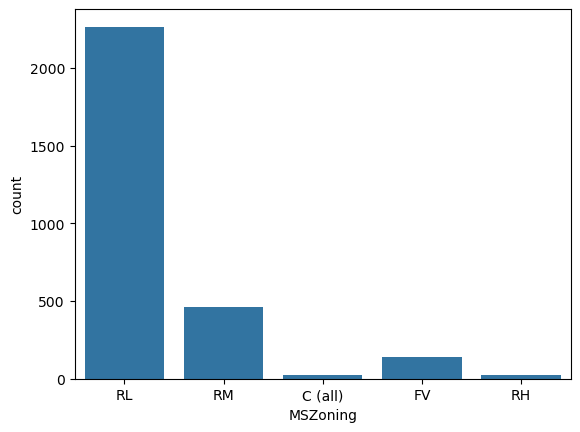

        Street  Ratio
Street               
Pave      2907 99.589
Grvl        12  0.411
##########################################


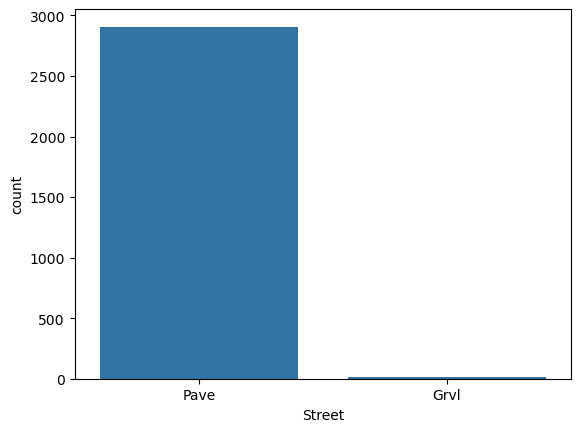

       Alley  Ratio
Alley              
Grvl     120  4.111
Pave      78  2.672
##########################################


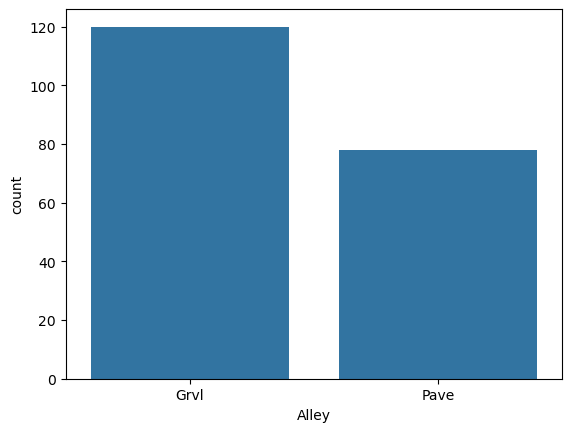

          LotShape  Ratio
LotShape                 
Reg           1859 63.686
IR1            968 33.162
IR2             76  2.604
IR3             16  0.548
##########################################


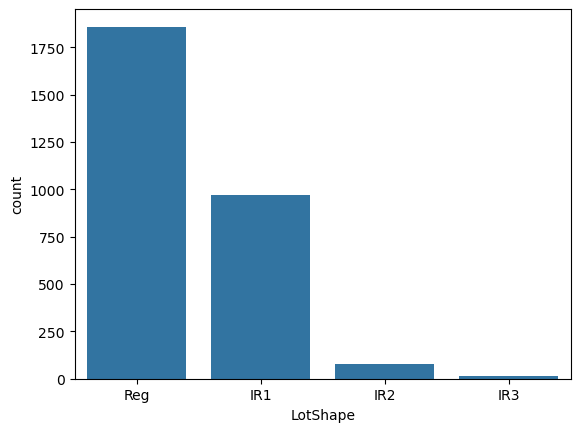

             LandContour  Ratio
LandContour                    
Lvl                 2622 89.825
HLS                  120  4.111
Bnk                  117  4.008
Low                   60  2.055
##########################################


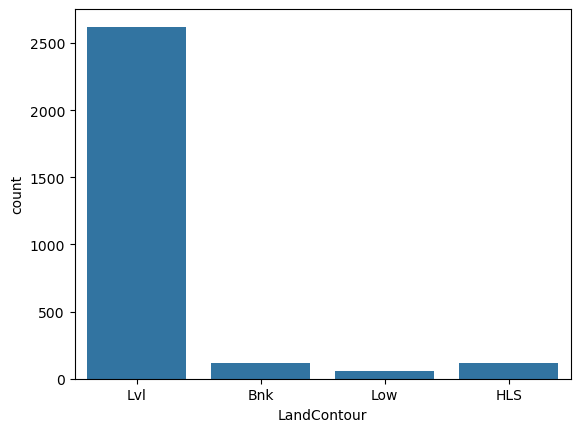

           Utilities  Ratio
Utilities                  
AllPub          2916 99.897
NoSeWa             1  0.034
##########################################


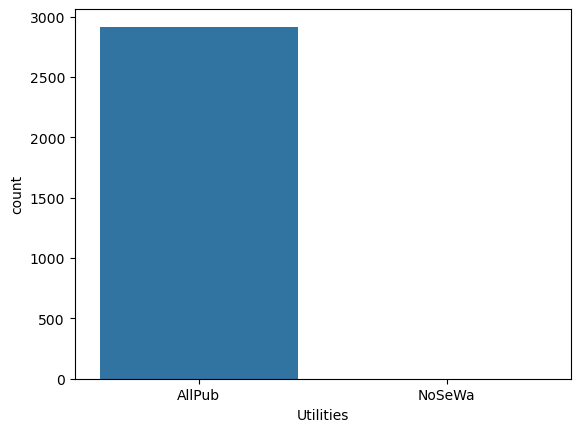

           LotConfig  Ratio
LotConfig                  
Inside          2133 73.073
Corner           511 17.506
CulDSac          176  6.029
FR2               85  2.912
FR3               14  0.480
##########################################


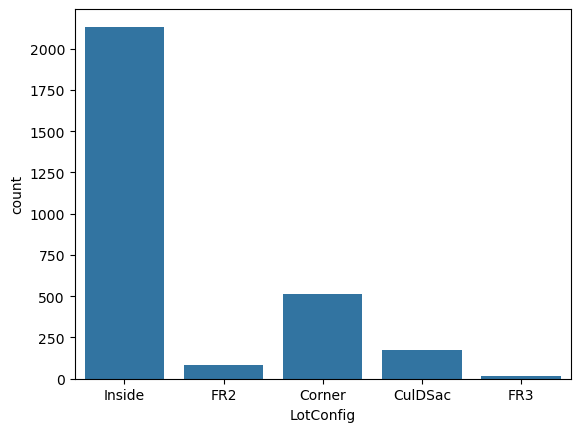

           LandSlope  Ratio
LandSlope                  
Gtl             2778 95.170
Mod              125  4.282
Sev               16  0.548
##########################################


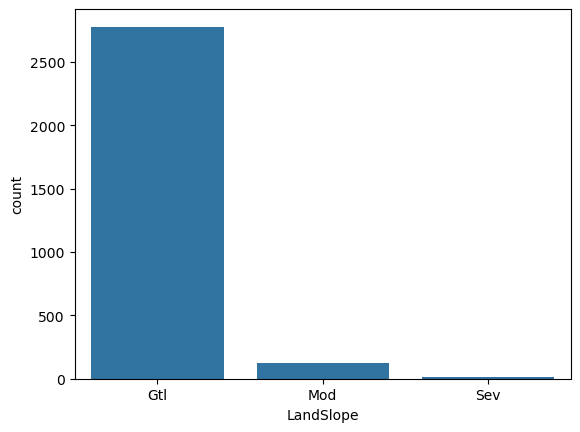

            Condition1  Ratio
Condition1                   
Norm              2511 86.023
Feedr              164  5.618
Artery              92  3.152
RRAn                50  1.713
PosN                39  1.336
RRAe                28  0.959
PosA                20  0.685
RRNn                 9  0.308
RRNe                 6  0.206
##########################################


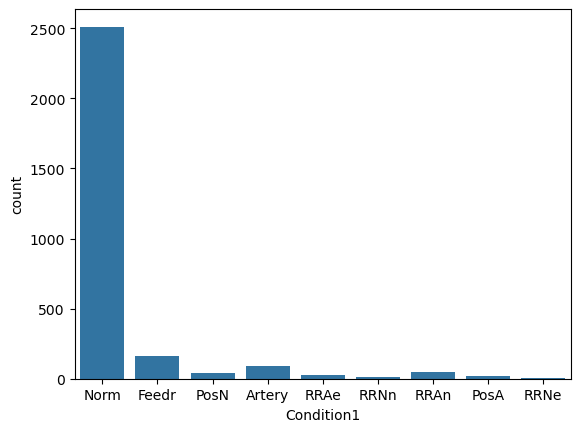

            Condition2  Ratio
Condition2                   
Norm              2889 98.972
Feedr               13  0.445
Artery               5  0.171
PosN                 4  0.137
PosA                 4  0.137
RRNn                 2  0.069
RRAn                 1  0.034
RRAe                 1  0.034
##########################################


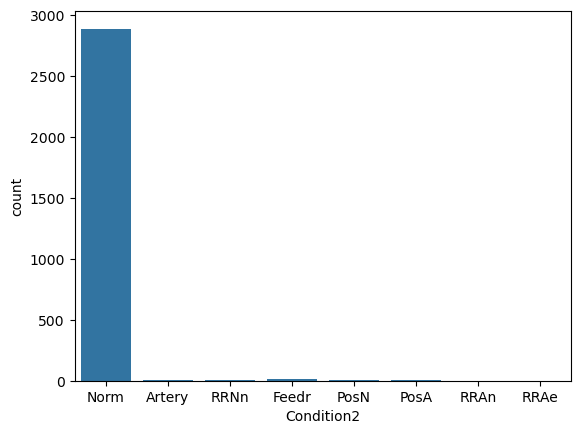

          BldgType  Ratio
BldgType                 
1Fam          2425 83.076
TwnhsE         227  7.777
Duplex         109  3.734
Twnhs           96  3.289
2fmCon          62  2.124
##########################################


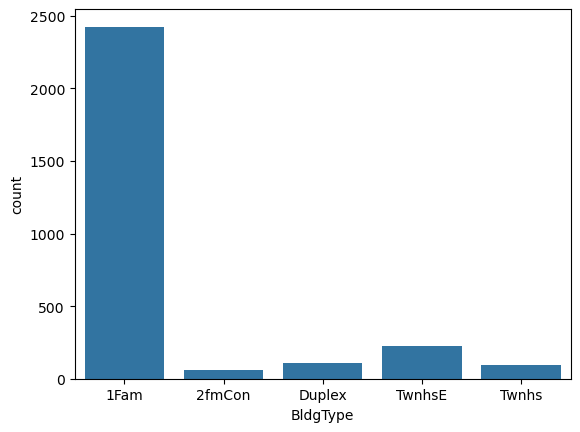

            HouseStyle  Ratio
HouseStyle                   
1Story            1471 50.394
2Story             872 29.873
1.5Fin             314 10.757
SLvl               128  4.385
SFoyer              83  2.843
2.5Unf              24  0.822
1.5Unf              19  0.651
2.5Fin               8  0.274
##########################################


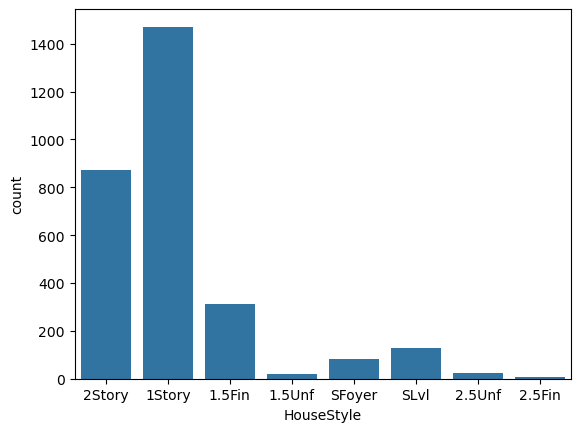

           RoofStyle  Ratio
RoofStyle                  
Gable           2310 79.137
Hip              551 18.876
Gambrel           22  0.754
Flat              20  0.685
Mansard           11  0.377
Shed               5  0.171
##########################################


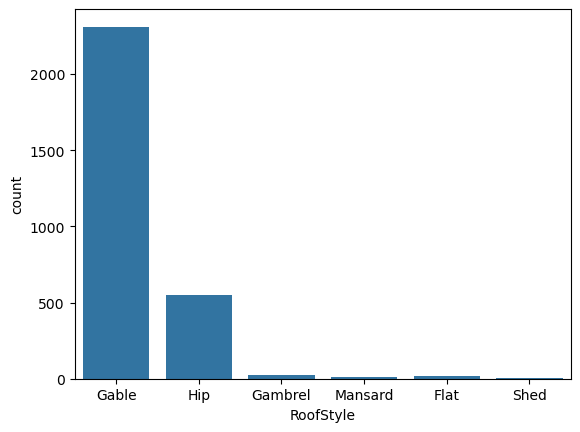

          RoofMatl  Ratio
RoofMatl                 
CompShg       2876 98.527
Tar&Grv         23  0.788
WdShake          9  0.308
WdShngl          7  0.240
Metal            1  0.034
Membran          1  0.034
Roll             1  0.034
ClyTile          1  0.034
##########################################


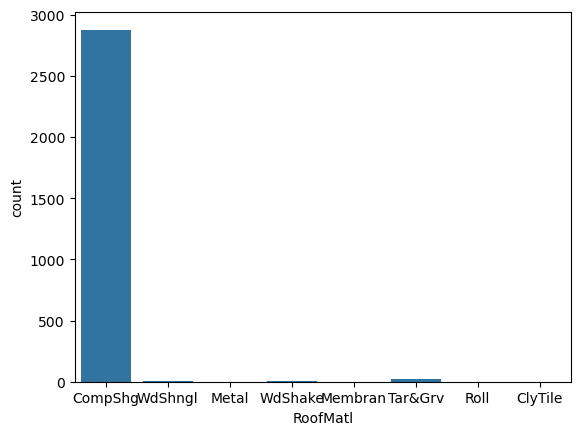

             Exterior1st  Ratio
Exterior1st                    
VinylSd             1025 35.115
MetalSd              450 15.416
HdBoard              442 15.142
Wd Sdng              411 14.080
Plywood              221  7.571
CemntBd              126  4.317
BrkFace               87  2.980
WdShing               56  1.918
AsbShng               44  1.507
Stucco                43  1.473
BrkComm                6  0.206
AsphShn                2  0.069
Stone                  2  0.069
CBlock                 2  0.069
ImStucc                1  0.034
##########################################


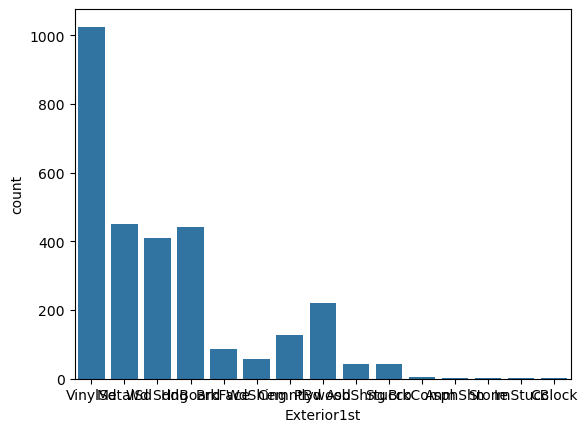

             Exterior2nd  Ratio
Exterior2nd                    
VinylSd             1014 34.738
MetalSd              447 15.313
HdBoard              406 13.909
Wd Sdng              391 13.395
Plywood              270  9.250
CmentBd              126  4.317
Wd Shng               81  2.775
BrkFace               47  1.610
Stucco                47  1.610
AsbShng               38  1.302
Brk Cmn               22  0.754
ImStucc               15  0.514
Stone                  6  0.206
AsphShn                4  0.137
CBlock                 3  0.103
Other                  1  0.034
##########################################


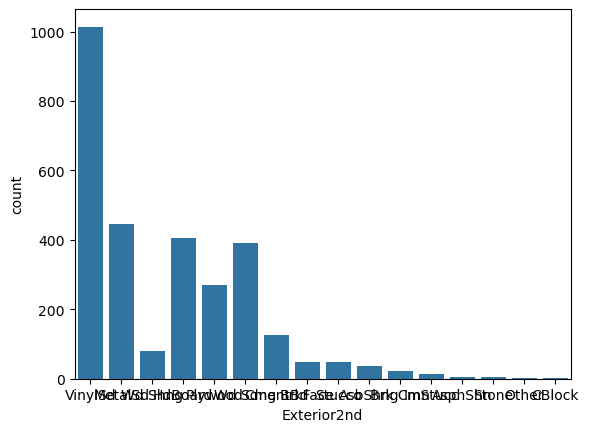

            MasVnrType  Ratio
MasVnrType                   
BrkFace            879 30.113
Stone              249  8.530
BrkCmn              25  0.856
##########################################


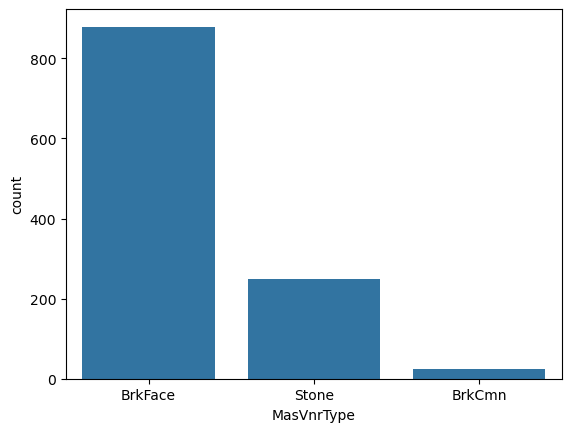

           ExterQual  Ratio
ExterQual                  
TA              1798 61.596
Gd               979 33.539
Ex               107  3.666
Fa                35  1.199
##########################################


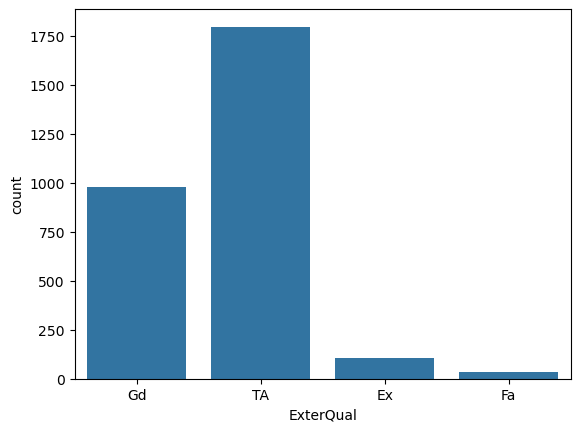

           ExterCond  Ratio
ExterCond                  
TA              2538 86.948
Gd               299 10.243
Fa                67  2.295
Ex                12  0.411
Po                 3  0.103
##########################################


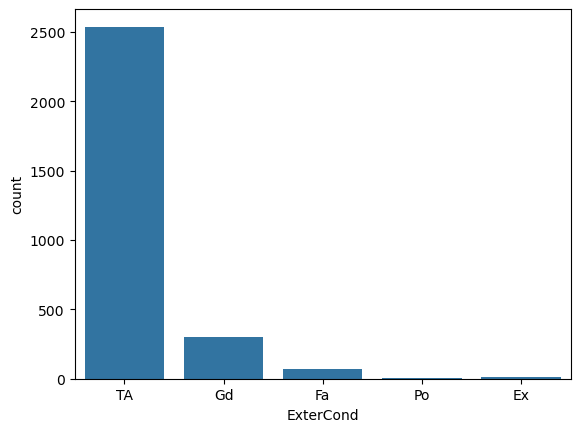

            Foundation  Ratio
Foundation                   
PConc             1308 44.810
CBlock            1235 42.309
BrkTil             311 10.654
Slab                49  1.679
Stone               11  0.377
Wood                 5  0.171
##########################################


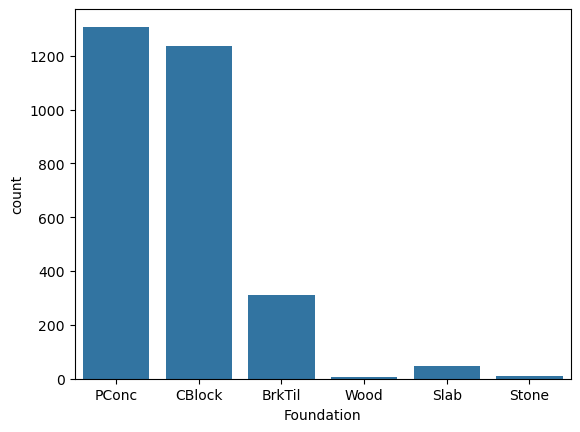

          BsmtQual  Ratio
BsmtQual                 
TA            1283 43.953
Gd            1209 41.418
Ex             258  8.839
Fa              88  3.015
##########################################


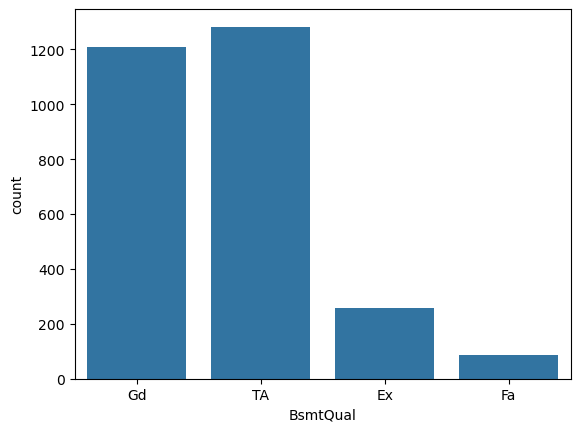

          BsmtCond  Ratio
BsmtCond                 
TA            2606 89.277
Gd             122  4.180
Fa             104  3.563
Po               5  0.171
##########################################


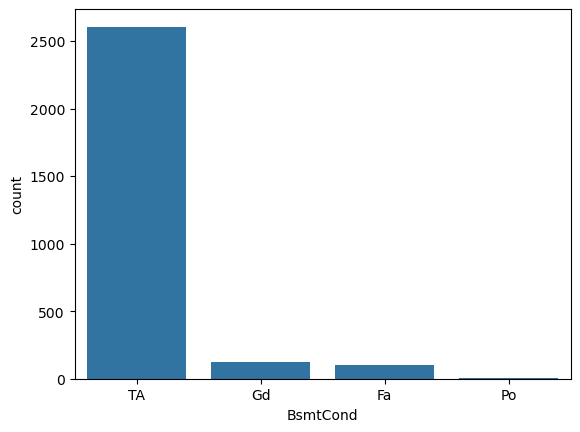

              BsmtExposure  Ratio
BsmtExposure                     
No                    1904 65.228
Av                     418 14.320
Gd                     276  9.455
Mn                     239  8.188
##########################################


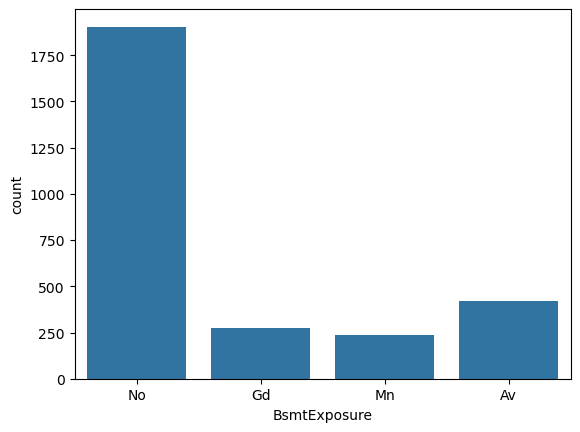

              BsmtFinType1  Ratio
BsmtFinType1                     
Unf                    851 29.154
GLQ                    849 29.085
ALQ                    429 14.697
Rec                    288  9.866
BLQ                    269  9.215
LwQ                    154  5.276
##########################################


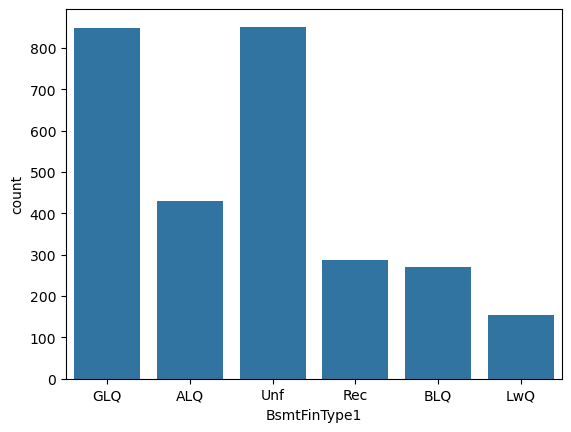

              BsmtFinType2  Ratio
BsmtFinType2                     
Unf                   2493 85.406
Rec                    105  3.597
LwQ                     87  2.980
BLQ                     68  2.330
ALQ                     52  1.781
GLQ                     34  1.165
##########################################


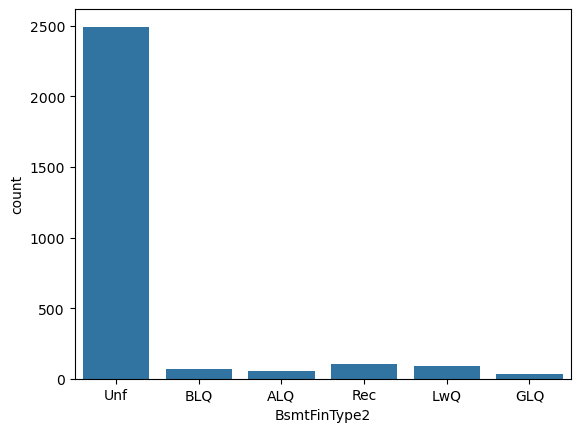

         Heating  Ratio
Heating                
GasA        2874 98.458
GasW          27  0.925
Grav           9  0.308
Wall           6  0.206
OthW           2  0.069
Floor          1  0.034
##########################################


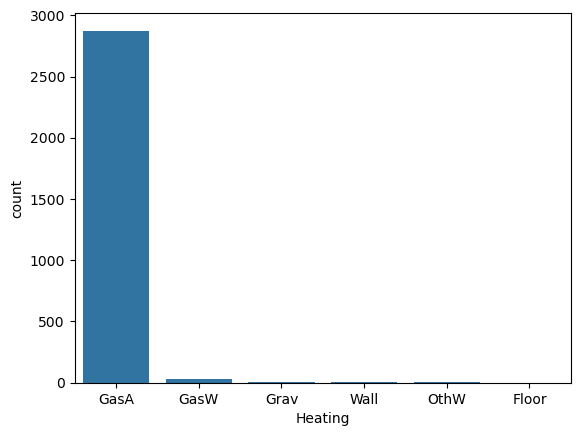

           HeatingQC  Ratio
HeatingQC                  
Ex              1493 51.148
TA               857 29.359
Gd               474 16.238
Fa                92  3.152
Po                 3  0.103
##########################################


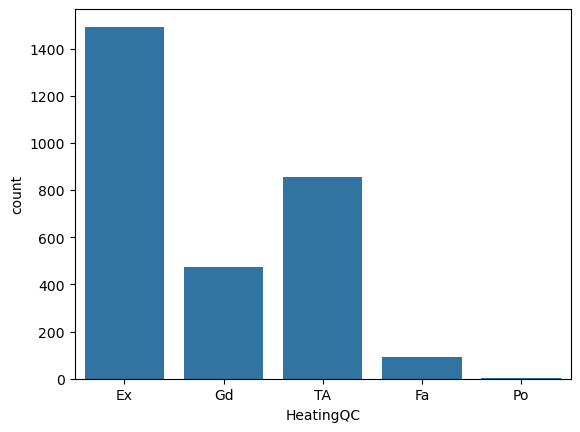

            CentralAir  Ratio
CentralAir                   
Y                 2723 93.285
N                  196  6.715
##########################################


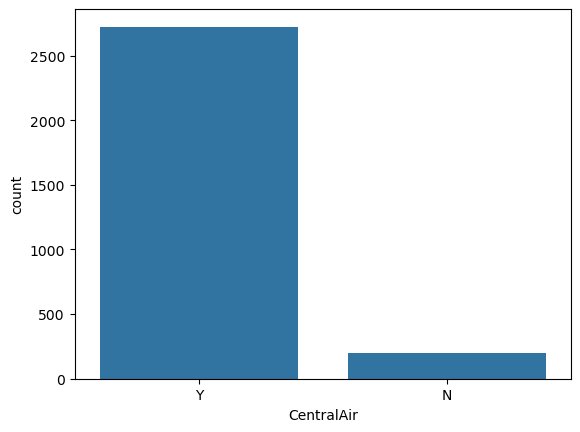

            Electrical  Ratio
Electrical                   
SBrkr             2671 91.504
FuseA              188  6.441
FuseF               50  1.713
FuseP                8  0.274
Mix                  1  0.034
##########################################


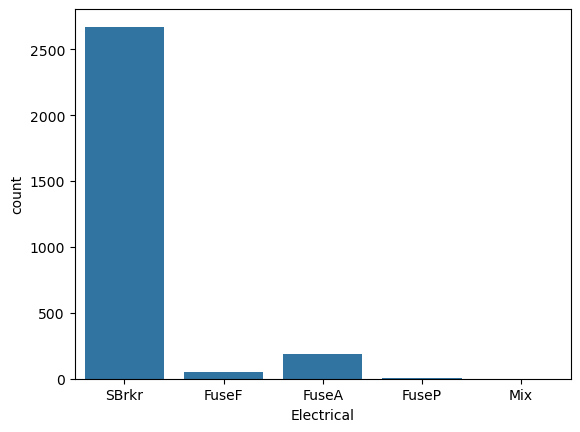

             KitchenQual  Ratio
KitchenQual                    
TA                  1492 51.113
Gd                  1151 39.431
Ex                   205  7.023
Fa                    70  2.398
##########################################


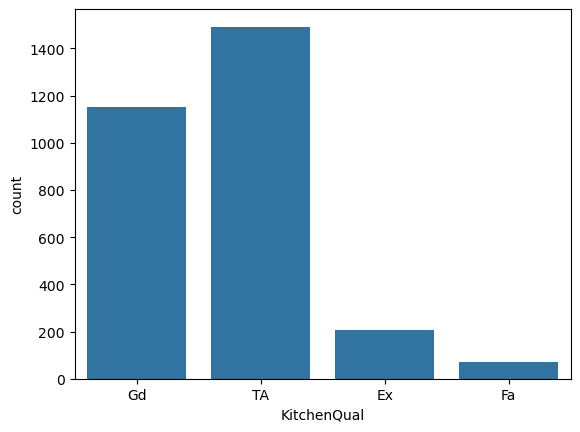

            Functional  Ratio
Functional                   
Typ               2717 93.080
Min2                70  2.398
Min1                65  2.227
Mod                 35  1.199
Maj1                19  0.651
Maj2                 9  0.308
Sev                  2  0.069
##########################################


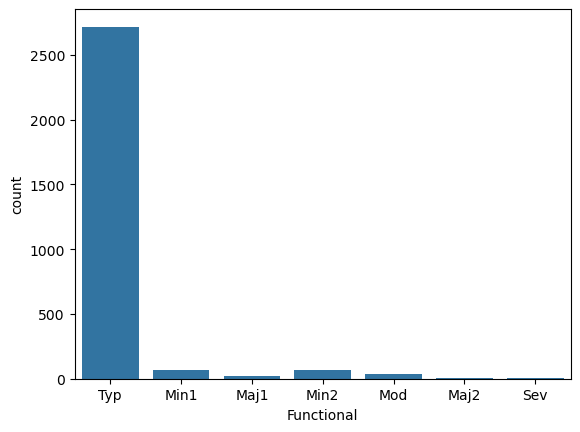

             FireplaceQu  Ratio
FireplaceQu                    
Gd                   744 25.488
TA                   592 20.281
Fa                    74  2.535
Po                    46  1.576
Ex                    43  1.473
##########################################


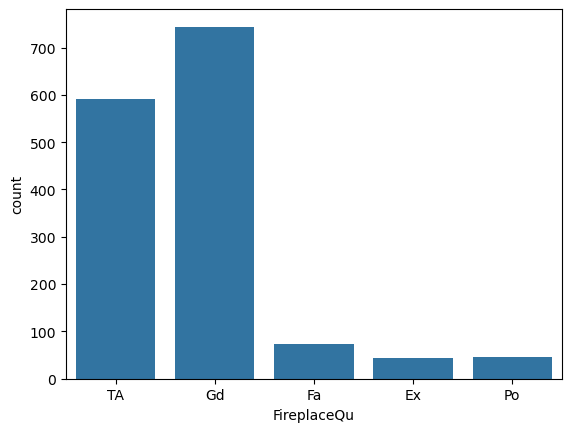

            GarageType  Ratio
GarageType                   
Attchd            1723 59.027
Detchd             779 26.687
BuiltIn            186  6.372
Basment             36  1.233
2Types              23  0.788
CarPort             15  0.514
##########################################


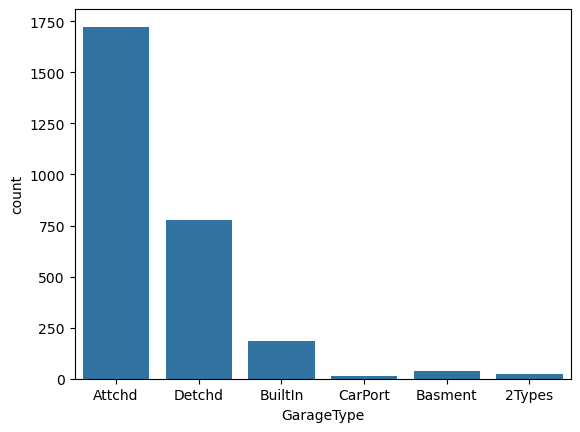

              GarageFinish  Ratio
GarageFinish                     
Unf                   1230 42.138
RFn                    811 27.783
Fin                    719 24.632
##########################################


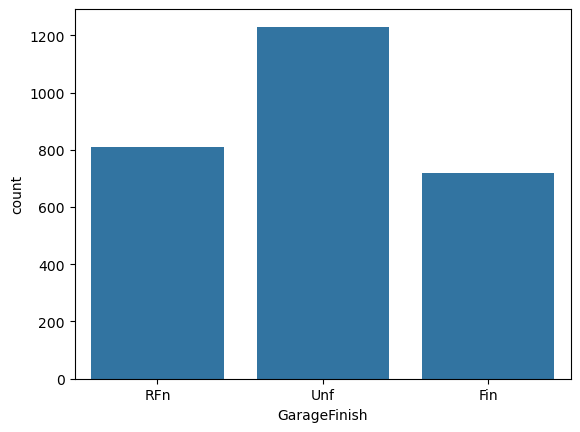

            GarageQual  Ratio
GarageQual                   
TA                2604 89.209
Fa                 124  4.248
Gd                  24  0.822
Po                   5  0.171
Ex                   3  0.103
##########################################


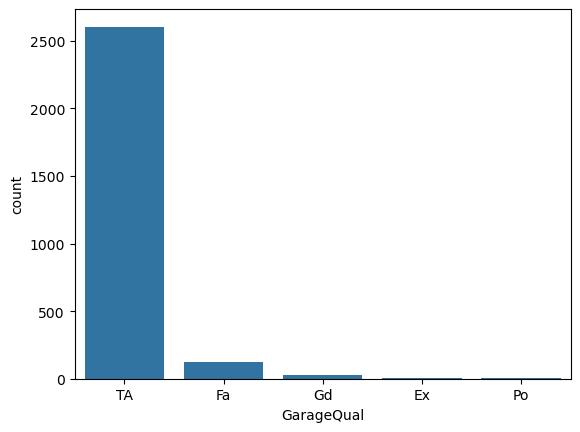

            GarageCond  Ratio
GarageCond                   
TA                2654 90.922
Fa                  74  2.535
Gd                  15  0.514
Po                  14  0.480
Ex                   3  0.103
##########################################


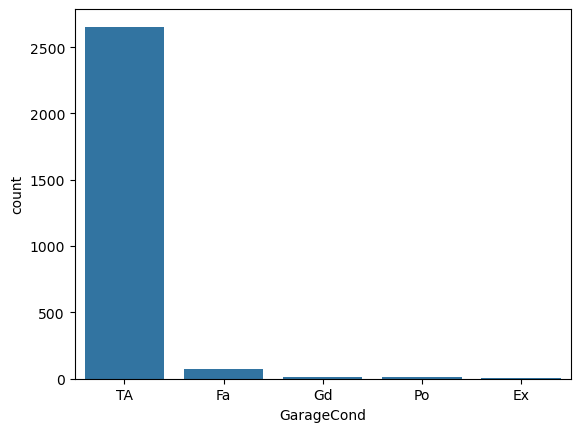

            PavedDrive  Ratio
PavedDrive                   
Y                 2641 90.476
N                  216  7.400
P                   62  2.124
##########################################


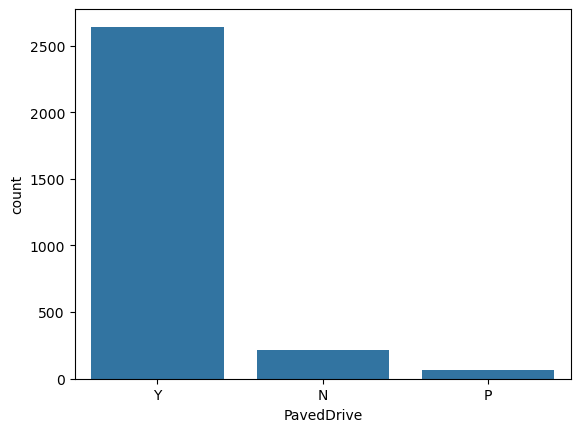

        PoolQC  Ratio
PoolQC               
Ex           4  0.137
Gd           4  0.137
Fa           2  0.069
##########################################


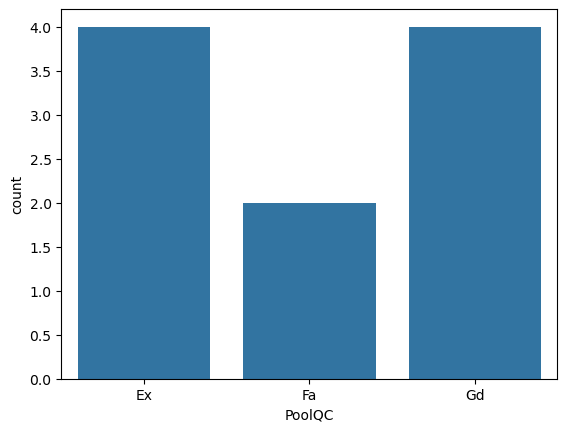

       Fence  Ratio
Fence              
MnPrv    329 11.271
GdPrv    118  4.042
GdWo     112  3.837
MnWw      12  0.411
##########################################


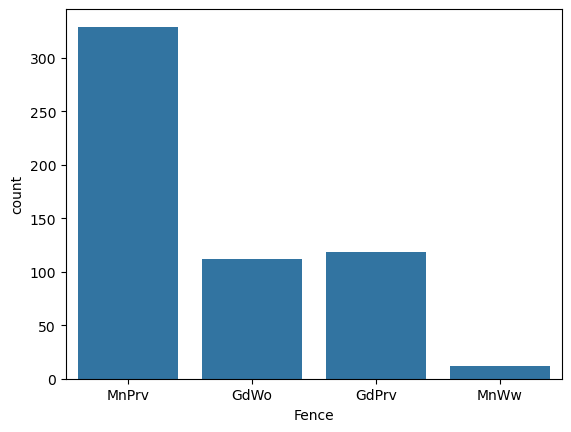

             MiscFeature  Ratio
MiscFeature                    
Shed                  95  3.255
Gar2                   5  0.171
Othr                   4  0.137
TenC                   1  0.034
##########################################


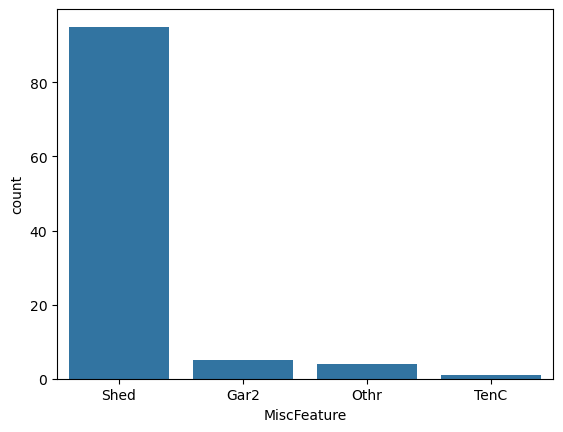

          SaleType  Ratio
SaleType                 
WD            2525 86.502
New            239  8.188
COD             87  2.980
ConLD           26  0.891
CWD             12  0.411
ConLI            9  0.308
ConLw            8  0.274
Oth              7  0.240
Con              5  0.171
##########################################


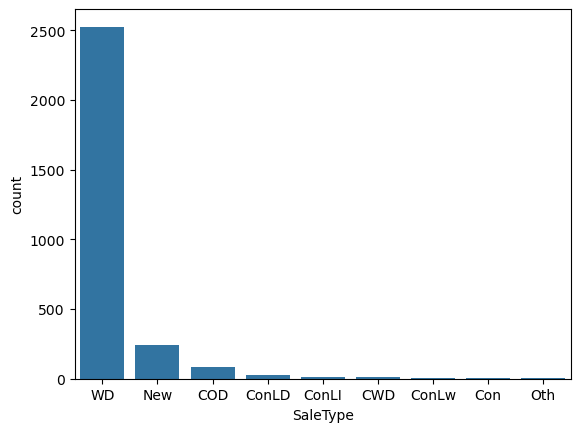

               SaleCondition  Ratio
SaleCondition                      
Normal                  2402 82.288
Partial                  245  8.393
Abnorml                  190  6.509
Family                    46  1.576
Alloca                    24  0.822
AdjLand                   12  0.411
##########################################


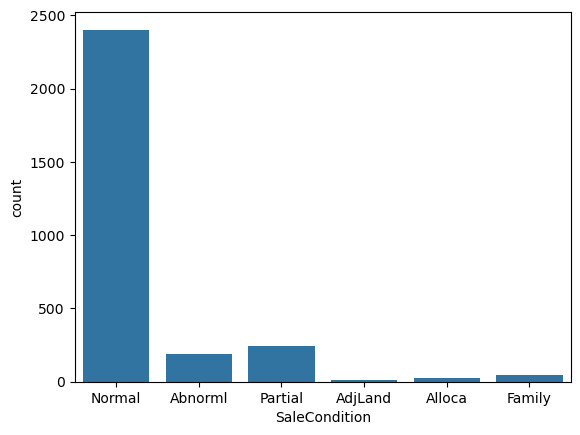

             OverallCond  Ratio
OverallCond                    
5                   1645 56.355
6                    531 18.191
7                    390 13.361
8                    144  4.933
4                    101  3.460
3                     50  1.713
9                     41  1.405
2                     10  0.343
1                      7  0.240
##########################################


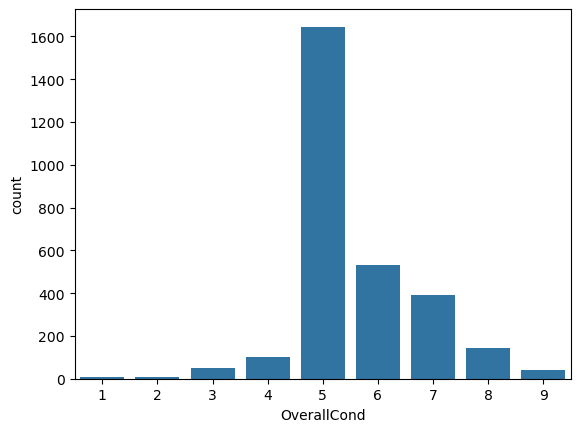

              BsmtFullBath  Ratio
BsmtFullBath                     
0.000                 1705 58.410
1.000                 1172 40.151
2.000                   38  1.302
3.000                    2  0.069
##########################################


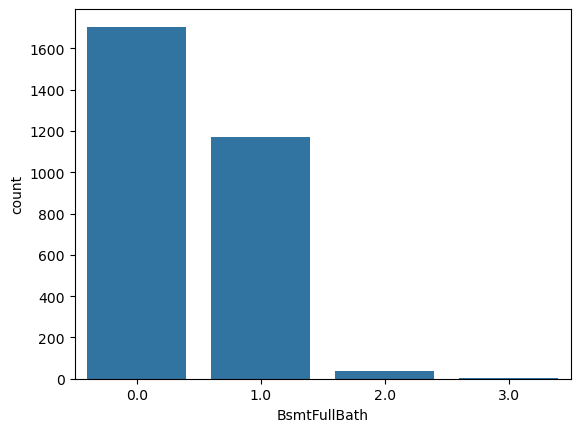

              BsmtHalfBath  Ratio
BsmtHalfBath                     
0.000                 2742 93.936
1.000                  171  5.858
2.000                    4  0.137
##########################################


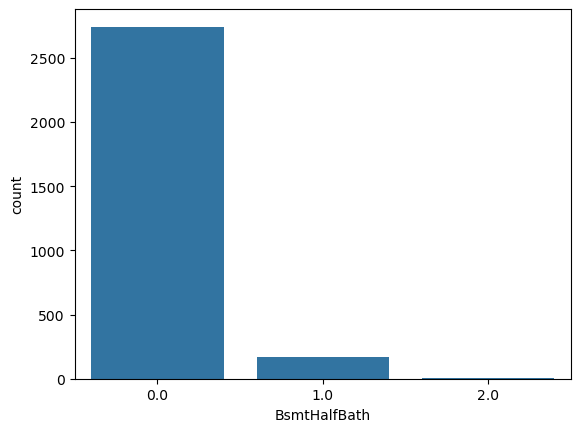

          FullBath  Ratio
FullBath                 
2             1530 52.415
1             1309 44.844
3               64  2.193
0               12  0.411
4                4  0.137
##########################################


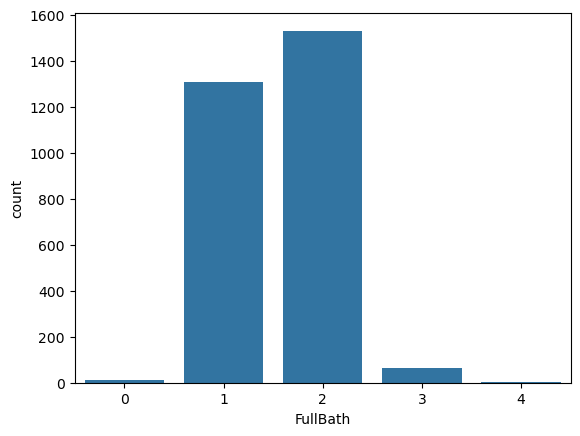

          HalfBath  Ratio
HalfBath                 
0             1834 62.830
1             1060 36.314
2               25  0.856
##########################################


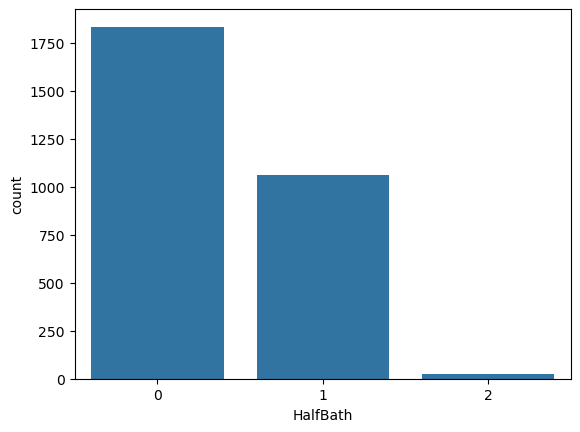

              BedroomAbvGr  Ratio
BedroomAbvGr                     
3                     1596 54.676
2                      742 25.420
4                      400 13.703
1                      103  3.529
5                       48  1.644
6                       21  0.719
0                        8  0.274
8                        1  0.034
##########################################


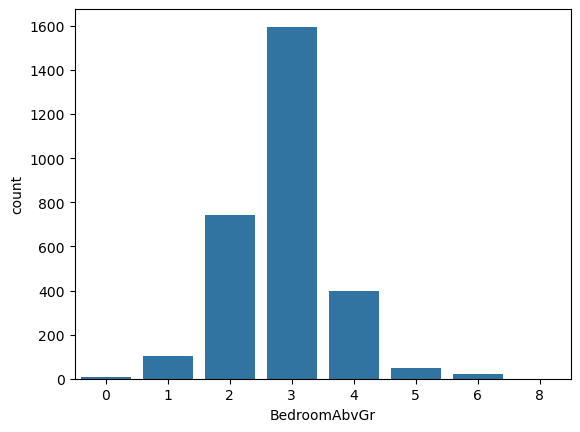

              KitchenAbvGr  Ratio
KitchenAbvGr                     
1                     2785 95.409
2                      129  4.419
0                        3  0.103
3                        2  0.069
##########################################


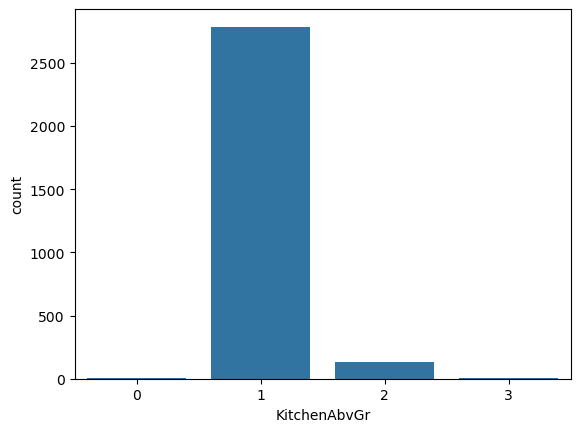

            Fireplaces  Ratio
Fireplaces                   
0                 1420 48.647
1                 1268 43.440
2                  219  7.503
3                   11  0.377
4                    1  0.034
##########################################


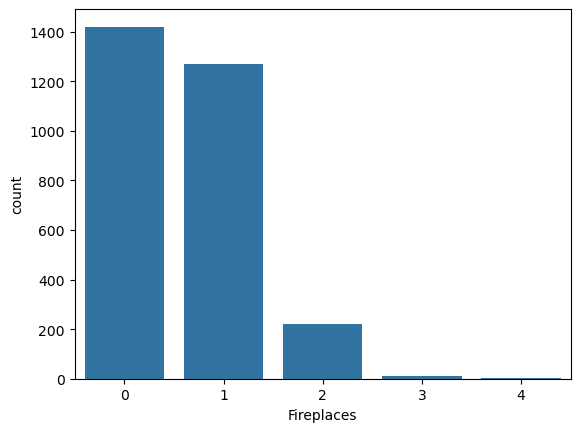

            GarageCars  Ratio
GarageCars                   
2.000             1594 54.608
1.000              776 26.584
3.000              374 12.813
0.000              157  5.379
4.000               16  0.548
5.000                1  0.034
##########################################


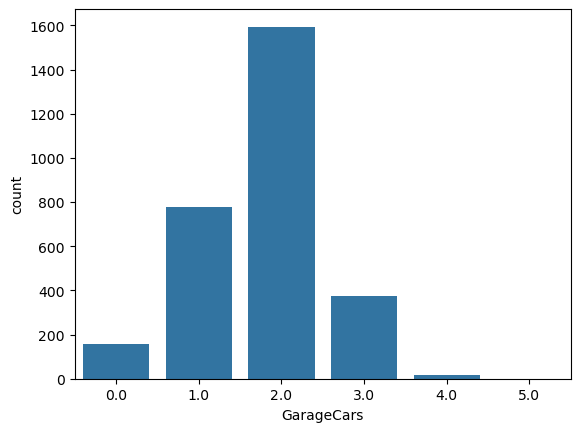

        YrSold  Ratio
YrSold               
2007       692 23.707
2009       647 22.165
2008       622 21.309
2006       619 21.206
2010       339 11.614
##########################################


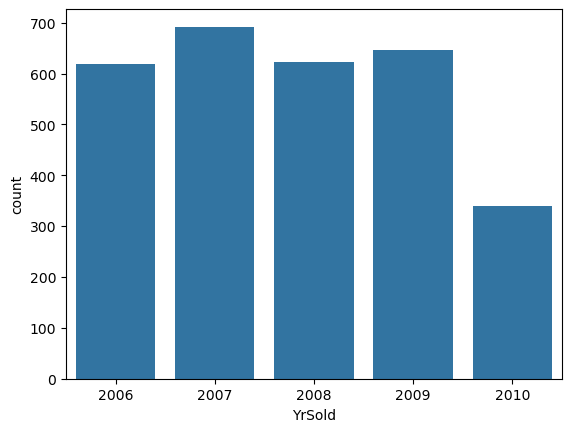

In [8]:
#Summary of Categoricals columns

cat_summary(df, cat_cols, True)

#### 2.2 ) Analysis of Numerical Variables

In [9]:
def num_summary(dataframe, col, groupby=None, log_scale=False, ax=None):
    """
    Plot histogram(s) for a column in a dataframe, optionally grouped by another column.

    Parameters:
    ----------
    dataframe : DataFrame
        The dataframe containing the data to plot.
    col : str
        Name of the column for which to plot the histogram.
    groupby : str or None, optional
        Name of the column by which to group the data. Default is None.
    log_scale : bool, optional
        Whether to use a logarithmic scale on the y-axis. Default is False.
    ax : matplotlib Axes object, optional
        Axes object to plot on. If None, a new figure and axes will be created. Default is None.

    Returns:
    -------
    None
    """
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(dataframe[col].describe(quantiles).T)

    
    # Set up the figure and axes if not provided
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))
    
    # Set seaborn color palette for colorblind accessibility and distinct colors
    sns.set_palette(sns.color_palette("viridis"))
    
    # Plot histogram with or without grouping
    if groupby is not None:
        sns.histplot(data=dataframe, x=col, bins=20, kde=True, hue=groupby, palette="viridis", ax=ax)
    else:
        sns.histplot(data=dataframe, x=col, bins=20, kde=True, color='mediumpurple', ax=ax)
    
    # Set plot labels and title
    ax.set_title(f'Histogram for {col}', fontsize=16, weight='bold')
    ax.set_xlabel(col, fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    
    # Set y-axis to log scale if log_scale is True
    if log_scale:
        ax.set_yscale('log')
    
    # Enhance grid and ticks for better readability
    ax.grid(True, linestyle='--', linewidth=0.5)
    ax.tick_params(axis='both', labelsize=12)

    # Adjust layout for better spacing
    plt.tight_layout()

count   2919.000
mean    1460.000
std      842.787
min        1.000
5%       146.900
10%      292.800
20%      584.600
30%      876.400
40%     1168.200
50%     1460.000
60%     1751.800
70%     2043.600
80%     2335.400
90%     2627.200
95%     2773.100
99%     2889.820
max     2919.000
Name: Id, dtype: float64
count   2919.000
mean      57.138
std       42.518
min       20.000
5%        20.000
10%       20.000
20%       20.000
30%       20.000
40%       30.000
50%       50.000
60%       60.000
70%       60.000
80%       80.000
90%      120.000
95%      160.000
99%      190.000
max      190.000
Name: MSSubClass, dtype: float64
count   2433.000
mean      69.306
std       23.345
min       21.000
5%        32.000
10%       43.000
20%       53.000
30%       60.000
40%       63.000
50%       68.000
60%       73.000
70%       78.000
80%       84.000
90%       95.000
95%      107.000
99%      135.680
max      313.000
Name: LotFrontage, dtype: float64
count     2919.000
mean     10168.114
std

C:\Users\KAZIM BEKTAS\AppData\Local\Temp\ipykernel_19176\1134375753.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(12, 6))


count   2919.000
mean       2.602
std       25.188
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%        0.000
99%      144.000
max      508.000
Name: 3SsnPorch, dtype: float64
count   2919.000
mean      16.062
std       56.184
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%      161.000
99%      259.820
max      576.000
Name: ScreenPorch, dtype: float64
count   2919.000
mean       2.252
std       35.664
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%        0.000
99%        0.000
max      800.000
Name: PoolArea, dtype: float64
count    2919.000
mean       50.826


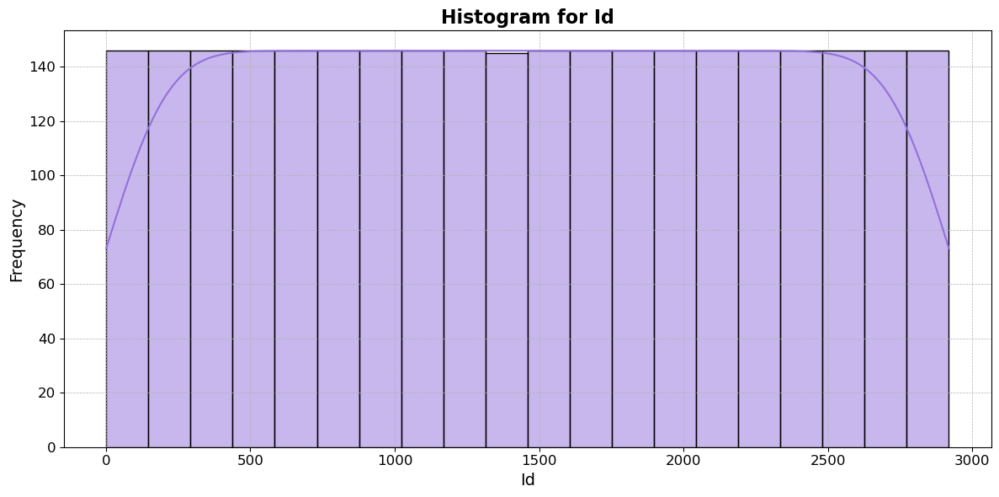

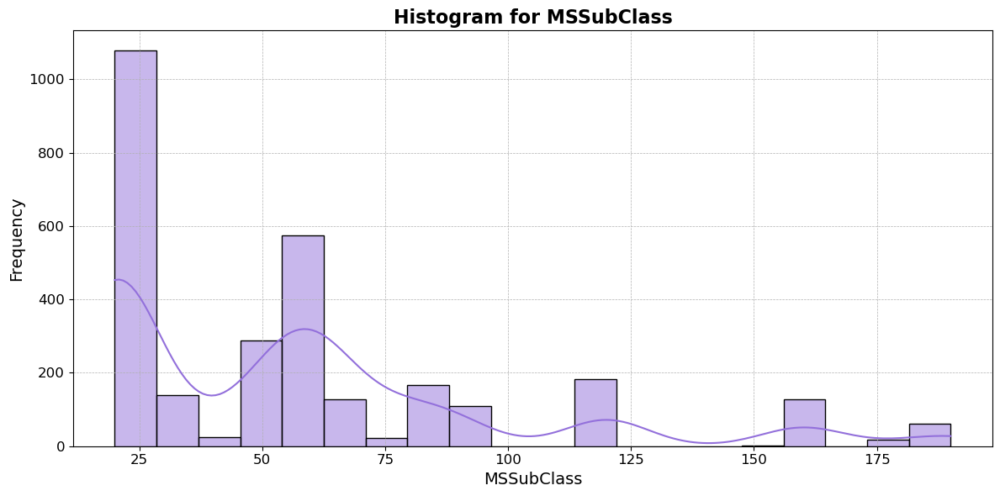

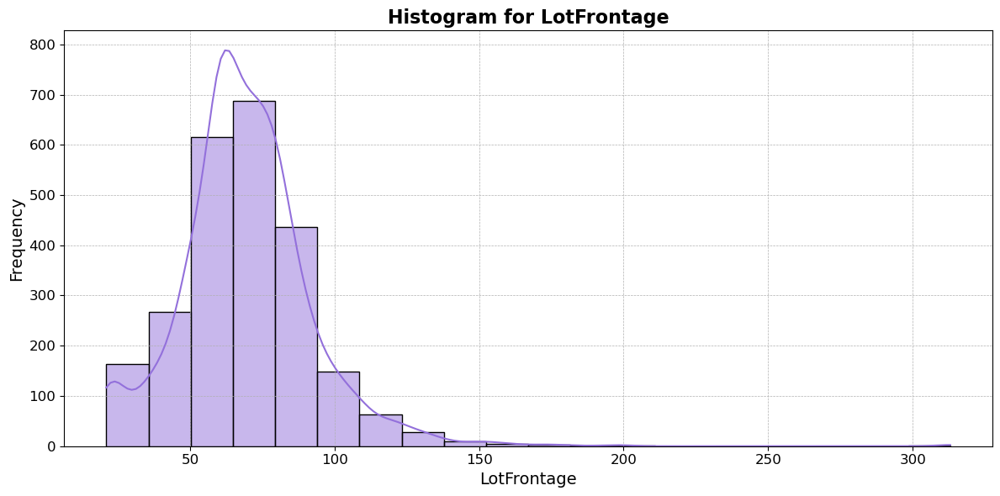

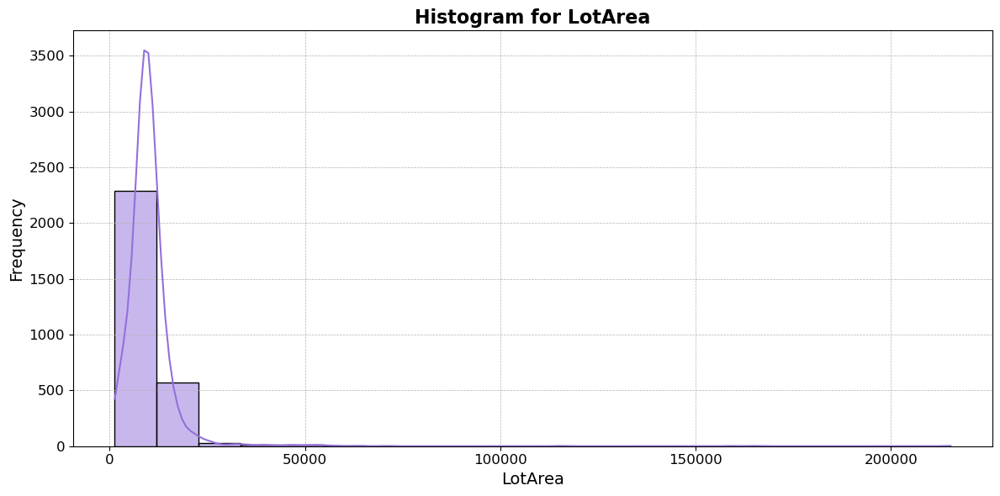

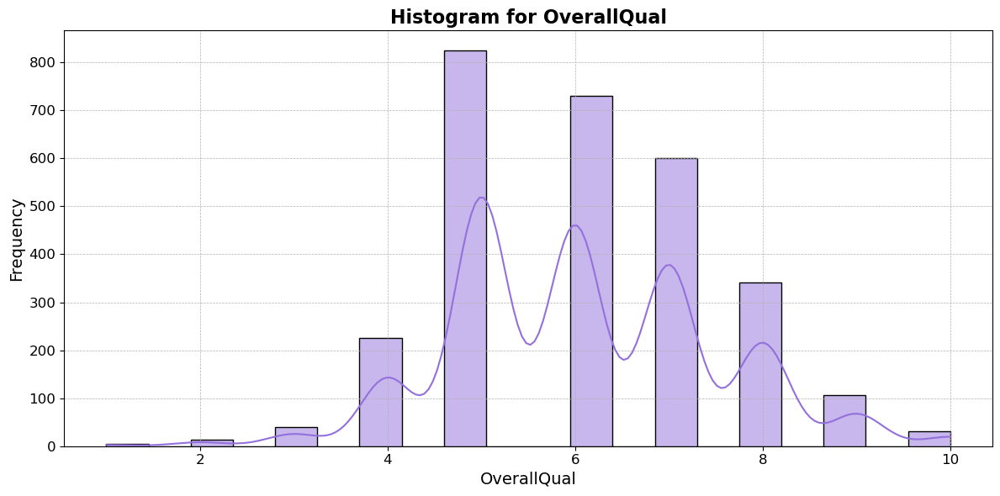

...

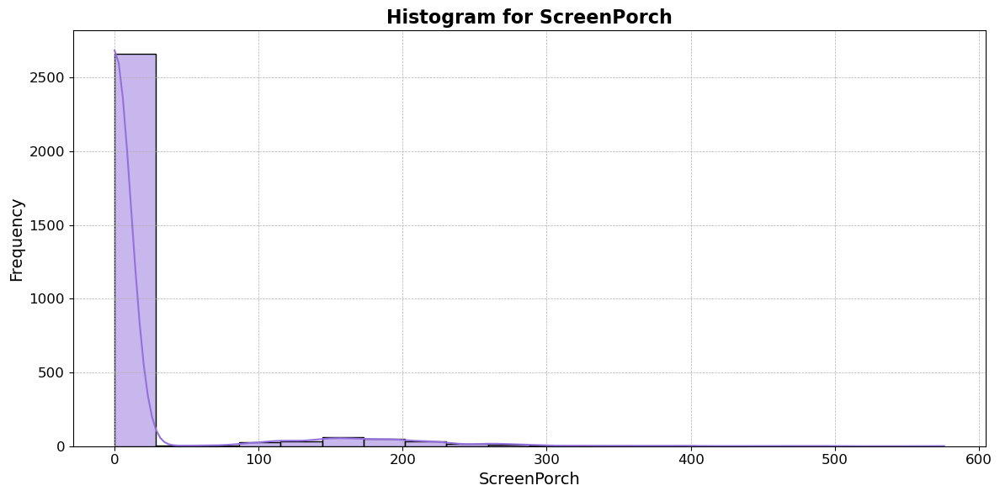

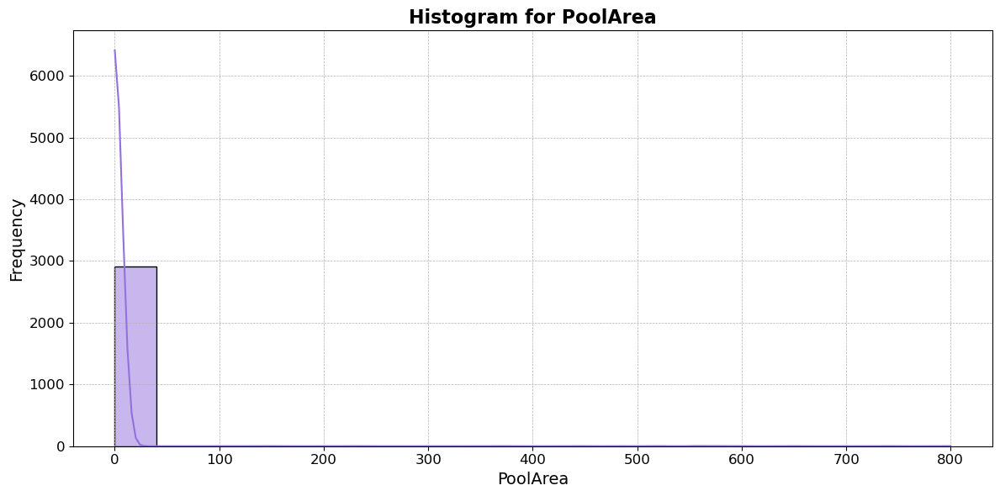

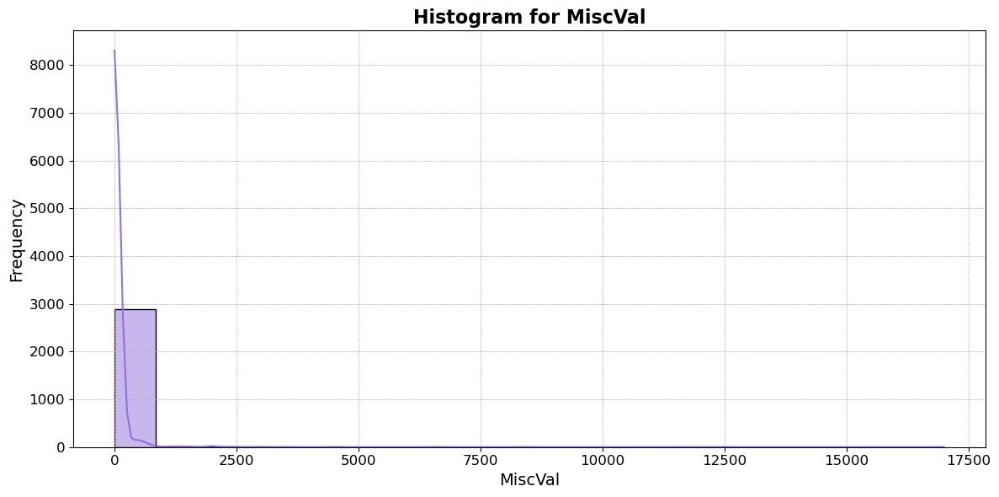

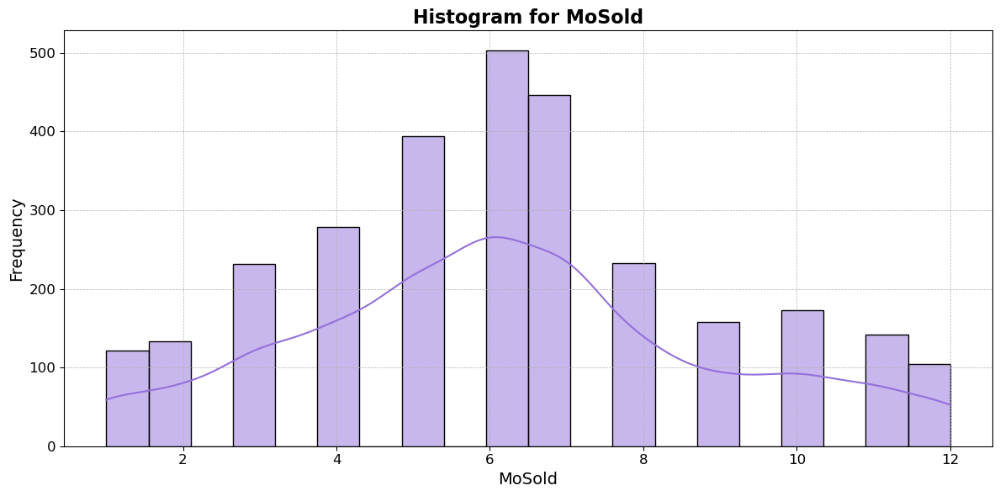

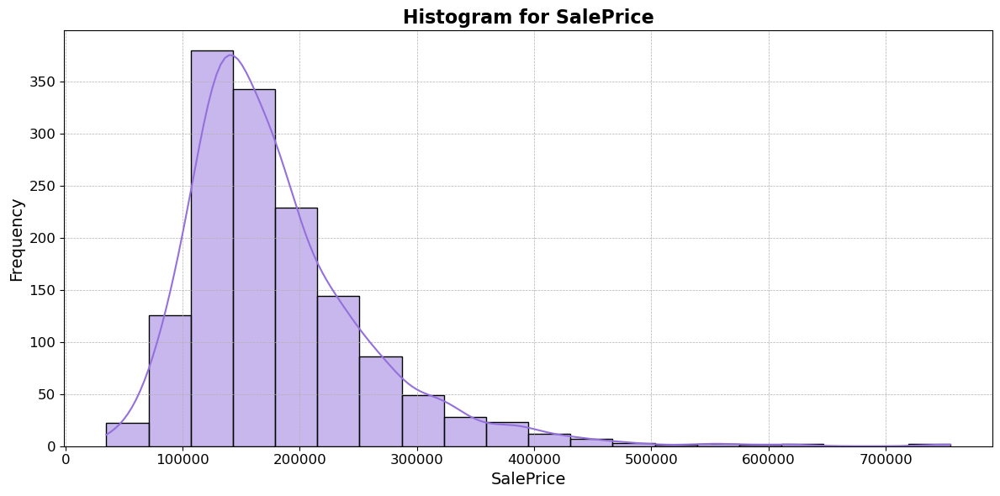

In [10]:
#Summary of Numericals columns

for col in num_cols:
    num_summary(df, col)

#### 2.3 )Analysis of Target Variable

In [11]:
def target_summary_with_cat(dataframe, target, categorical_col):
    print(pd.DataFrame({"TARGET_MEAN": dataframe.groupby(categorical_col)[target].mean()}), end="\n\n\n")

for col in cat_cols:
    target_summary_with_cat(df, "SalePrice", col)

          TARGET_MEAN
MSZoning             
C (all)     74528.000
FV         214014.062
RH         131558.375
RL         191004.995
RM         126316.830


        TARGET_MEAN
Street             
Grvl     130190.500
Pave     181130.539


       TARGET_MEAN
Alley             
Grvl    122219.080
Pave    168000.585


          TARGET_MEAN
LotShape             
IR1        206101.665
IR2        239833.366
IR3        216036.500
Reg        164754.818


             TARGET_MEAN
LandContour             
Bnk           143104.079
HLS           231533.940
Low           203661.111
Lvl           180183.747


           TARGET_MEAN
Utilities             
AllPub      180950.957
NoSeWa      137500.000


           TARGET_MEAN
LotConfig             
Corner      181623.426
CulDSac     223854.617
FR2         177934.574
FR3         208475.000
Inside      176938.048


           TARGET_MEAN
LandSlope             
Gtl         179956.800
Mod         196734.138
Sev         204379.231


            TARGET_MEAN


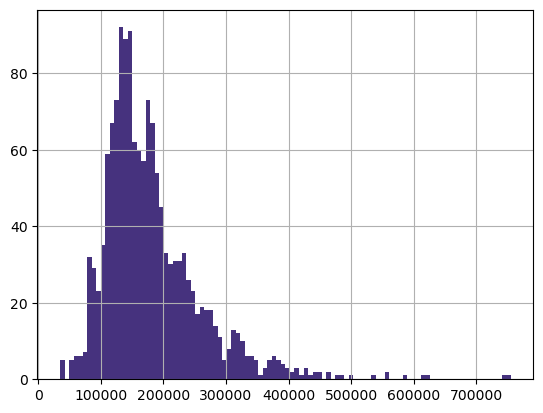

In [12]:
# Examining the dependent variable
df["SalePrice"].hist(bins=100)
plt.show()

The sale prices of houses often exhibit a right-skewed distribution, meaning that there are a few very high prices which skew the data.
Applying the natural logarithm transformation to the SalePrice can help in normalizing the distribution. This transformation reduces skewness, making the data more symmetric and resembling a normal distribution. This is beneficial for many statistical models and machine learning algorithms, which perform better with normally distributed data.

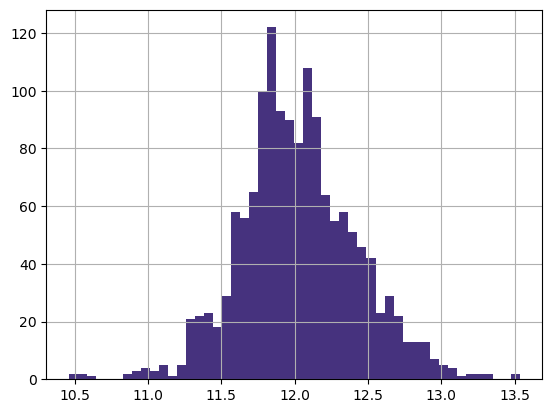

In [13]:
# Examining the logarithm of the dependent variable
np.log1p(df['SalePrice']).hist(bins=50)
plt.show()


#### 2.4 )Analysis of Correlation

In [14]:
# Display the correlation matrix for numerical variables.

df[num_cols].corr()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice
Id,1.000,0.009,-0.028,-0.041,-0.030,-0.017,-0.050,-0.025,-0.017,0.018,-0.014,-0.025,-0.009,-0.022,-0.038,-0.029,-0.029,-0.027,-0.009,-0.007,0.010,0.022,-0.047,0.022,0.014,0.008,0.006,-0.022
MSSubClass,0.009,1.000,-0.417,-0.202,0.034,0.034,0.043,0.005,-0.064,-0.073,-0.126,-0.220,-0.249,0.309,0.026,0.072,0.041,0.088,-0.103,-0.018,-0.016,-0.021,-0.038,-0.049,-0.003,-0.029,-0.001,-0.084
LotFrontage,-0.028,-0.417,1.000,0.490,0.218,0.123,0.092,0.221,0.219,0.047,0.114,0.355,0.458,0.027,0.005,0.382,0.350,0.077,0.360,0.122,0.165,0.012,0.028,0.076,0.174,0.044,0.011,0.352
LotArea,-0.041,-0.202,0.490,1.000,0.101,0.024,0.022,0.126,0.194,0.084,0.021,0.254,0.332,0.032,0.001,0.285,0.214,-0.009,0.213,0.158,0.105,0.021,0.016,0.054,0.094,0.069,0.004,0.264
OverallQual,-0.030,0.034,0.218,0.101,1.000,0.598,0.572,0.433,0.282,-0.043,0.275,0.549,0.479,0.246,-0.048,0.575,0.390,0.572,0.565,0.255,0.298,-0.139,0.019,0.043,0.031,0.006,0.030,0.791
YearBuilt,-0.017,0.034,0.123,0.024,0.598,1.000,0.612,0.314,0.280,-0.028,0.130,0.409,0.311,0.018,-0.144,0.243,0.114,0.835,0.481,0.229,0.199,-0.374,0.016,-0.041,0.002,-0.011,0.014,0.523
YearRemodAdd,-0.050,0.043,0.092,0.022,0.572,0.612,1.000,0.197,0.152,-0.062,0.165,0.298,0.242,0.159,-0.060,0.317,0.198,0.652,0.377,0.219,0.242,-0.220,0.037,-0.047,-0.011,-0.003,0.018,0.507
MasVnrArea,-0.025,0.005,0.221,0.126,0.433,0.314,0.197,1.000,0.303,-0.016,0.090,0.397,0.396,0.121,-0.058,0.403,0.278,0.255,0.374,0.166,0.145,-0.111,0.014,0.065,0.005,0.045,-0.000,0.477
BsmtFinSF1,-0.017,-0.064,0.219,0.194,0.282,0.280,0.152,0.303,1.000,-0.055,-0.477,0.536,0.458,-0.162,-0.066,0.212,0.052,0.194,0.310,0.223,0.124,-0.100,0.051,0.097,0.084,0.093,-0.001,0.386
BsmtFinSF2,0.018,-0.073,0.047,0.084,-0.043,-0.028,-0.062,-0.016,-0.055,1.000,-0.238,0.089,0.084,-0.098,-0.005,-0.018,-0.048,-0.069,0.003,0.098,-0.006,0.033,-0.023,0.063,0.045,-0.005,-0.010,-0.011


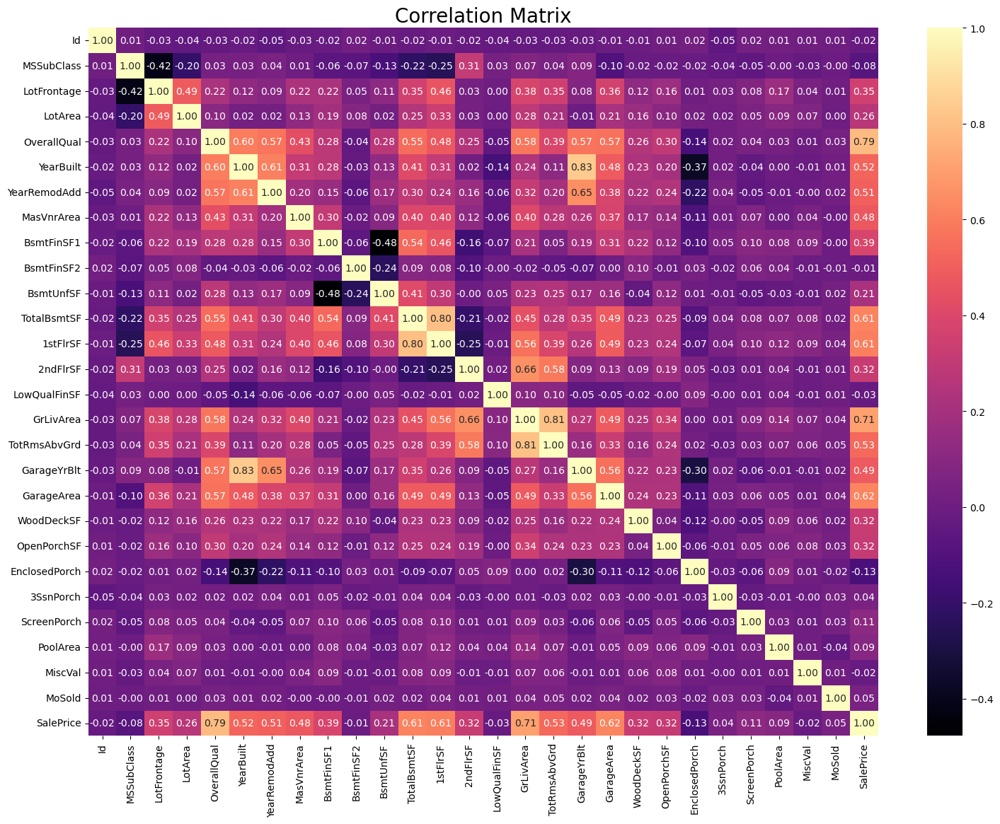

In [15]:
# Plot the correlation matrix.

f, ax = plt.subplots(figsize=[18, 13])
sns.heatmap(df[num_cols].corr(), annot=True, fmt=".2f", ax=ax, cmap="magma")
ax.set_title("Correlation Matrix", fontsize=20)
plt.show()

In [16]:
# This function identifies highly correlated columns in a dataset and optionally plots the correlation matrix.

def high_correlated_cols(dataframe, plot=False, corr_th=0.70):
    numeric_df = dataframe.select_dtypes(include=[np.number])
    corr = numeric_df.corr()
    cor_matrix = corr.abs()
    upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))
    drop_list = [col for col in upper_triangle_matrix.columns if any(upper_triangle_matrix[col] > corr_th)]
    if plot:
        sns.set(rc={'figure.figsize': (25, 25)})
        sns.heatmap(corr, cmap="RdBu", annot=True)
        plt.show()
    return drop_list

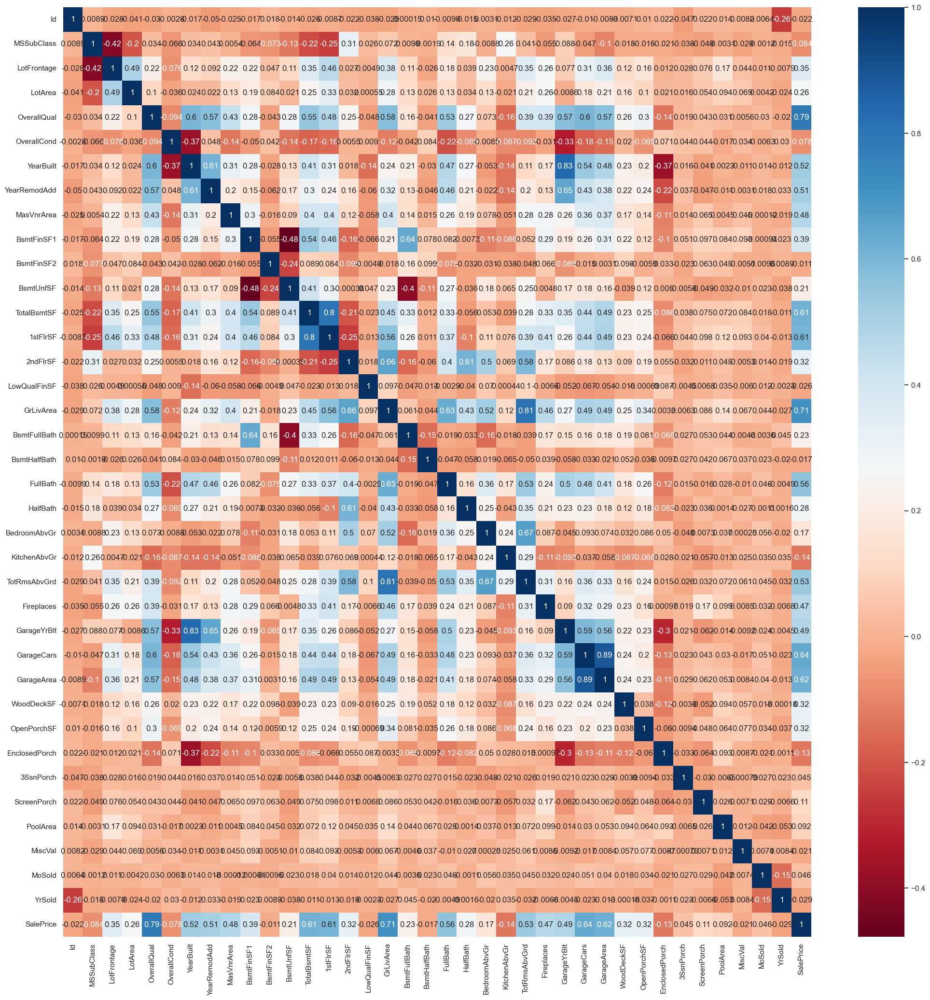

In [17]:
drop_list = high_correlated_cols(df, plot=True)

In [18]:
# Choosing only numeric column
numeric_df = df.select_dtypes(include=[np.number])

# Define correlation matrix
corr_matrix = numeric_df.corr()

# Correlation of Sales Price
saleprice_corr = corr_matrix['SalePrice'].abs().sort_values(ascending=False)
print(saleprice_corr)


SalePrice       1.000
OverallQual     0.791
GrLivArea       0.709
GarageCars      0.640
GarageArea      0.623
TotalBsmtSF     0.614
1stFlrSF        0.606
FullBath        0.561
TotRmsAbvGrd    0.534
YearBuilt       0.523
YearRemodAdd    0.507
GarageYrBlt     0.486
MasVnrArea      0.477
Fireplaces      0.467
BsmtFinSF1      0.386
LotFrontage     0.352
WoodDeckSF      0.324
2ndFlrSF        0.319
OpenPorchSF     0.316
HalfBath        0.284
LotArea         0.264
BsmtFullBath    0.227
BsmtUnfSF       0.214
BedroomAbvGr    0.168
KitchenAbvGr    0.136
EnclosedPorch   0.129
ScreenPorch     0.111
PoolArea        0.092
MSSubClass      0.084
OverallCond     0.078
MoSold          0.046
3SsnPorch       0.045
YrSold          0.029
LowQualFinSF    0.026
Id              0.022
MiscVal         0.021
BsmtHalfBath    0.017
BsmtFinSF2      0.011
Name: SalePrice, dtype: float64


In [19]:

top_corr_features = saleprice_corr.index[:20]

print("Columns with the highest correlation: ", top_corr_features)

Columns with the highest correlation:  Index(['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea',
       'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt',
       'YearRemodAdd', 'GarageYrBlt', 'MasVnrArea', 'Fireplaces', 'BsmtFinSF1',
       'LotFrontage', 'WoodDeckSF', '2ndFlrSF', 'OpenPorchSF', 'HalfBath'],
      dtype='object')


#### 2.5 )Analyzing of Outiers

In [20]:
# The outlier_thresholds function is used to calculate the lower and upper limits for identifying outliers in a 
# specified column of a pandas DataFrame based on the interquartile range (IQR) method. 

def outlier_thresholds(dataframe, col_name, q1=0.05, q3=0.95):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

# The check_outlier function is designed to determine whether there are any outliers in a specified column of a pandas DataFrame.
def check_outlier(dataframe, col_name):
    # Calculate the lower and upper limits for outliers in the specified column using the outlier_thresholds function
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    # Check if there are any values in the specified column that are outside the calculated limits
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    # If there is at least one value outside the limits, return True
    else:
    # If there are no values outside the limits, return False
        return False

def replace_with_thresholds(dataframe, variable, q1=0.05, q3=0.95):
    # Calculate the lower and upper limits for outliers in the specified variable using the outlier_thresholds function with the given quantiles (q1 and q3)
    low_limit, up_limit = outlier_thresholds(dataframe, variable, q1=0.05, q3=0.95)
    # Replace values in the specified variable that are below the lower limit with the lower limit
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [21]:
# Checking for outliers expect SalePrice

for col in num_cols:
    if col != "SalePrice":
        print(col, check_outlier(df, col))

Id False
MSSubClass False
LotFrontage True
LotArea True
OverallQual False
YearBuilt False
YearRemodAdd False
MasVnrArea True
BsmtFinSF1 True
BsmtFinSF2 True
BsmtUnfSF False
TotalBsmtSF True
1stFlrSF True
2ndFlrSF False
LowQualFinSF True
GrLivArea True
TotRmsAbvGrd False
GarageYrBlt True
GarageArea False
WoodDeckSF True
OpenPorchSF True
EnclosedPorch True
3SsnPorch True
ScreenPorch True
PoolArea True
MiscVal True
MoSold False


In [22]:
# # Truncating outliers

def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

for col in num_cols:
    if col != "SalePrice":
        replace_with_thresholds(df, col)

In [23]:
# Checking for outliers expect SalePrice

for col in num_cols:
    if col != "SalePrice":
        print(col, check_outlier(df, col))

Id False
MSSubClass False
LotFrontage False
LotArea False
OverallQual False
YearBuilt False
YearRemodAdd False
MasVnrArea False
BsmtFinSF1 False
BsmtFinSF2 False
BsmtUnfSF False
TotalBsmtSF False
1stFlrSF False
2ndFlrSF False
LowQualFinSF False
GrLivArea False
TotRmsAbvGrd False
GarageYrBlt False
GarageArea False
WoodDeckSF False
OpenPorchSF False
EnclosedPorch False
3SsnPorch False
ScreenPorch False
PoolArea False
MiscVal False
MoSold False


#### 2.6 )Analyzing of Missing Values

In [24]:
def missing_values_table(dataframe, na_name=False):
    # Identify columns with missing values
    na_columns = [col for col in dataframe.columns if dataframe[col].isnull().sum() > 0]
    
    # Calculate the number of missing values in each column
    n_miss = dataframe[na_columns].isnull().sum().sort_values(ascending=False)
    
    # Calculate the percentage of missing values in each column
    ratio = (dataframe[na_columns].isnull().sum() / dataframe.shape[0] * 100).sort_values(ascending=False)
    
    # Combine the number of missing values and their ratios into a DataFrame
    missing_df = pd.concat([n_miss, np.round(ratio, 2)], axis=1, keys=['n_miss', 'ratio'])
    
    # Print the DataFrame showing the count and percentage of missing values
    print(missing_df, end="\n")
    
    # If na_name is True, return the list of columns with missing values
    if na_name:
        return na_columns

In [25]:
missing_values_table(df)

              n_miss  ratio
PoolQC          2909 99.660
MiscFeature     2814 96.400
Alley           2721 93.220
Fence           2348 80.440
MasVnrType      1766 60.500
SalePrice       1459 49.980
FireplaceQu     1420 48.650
LotFrontage      486 16.650
GarageCond       159  5.450
GarageYrBlt      159  5.450
GarageFinish     159  5.450
GarageQual       159  5.450
GarageType       157  5.380
BsmtExposure      82  2.810
BsmtCond          82  2.810
BsmtQual          81  2.770
BsmtFinType2      80  2.740
BsmtFinType1      79  2.710
MasVnrArea        23  0.790
MSZoning           4  0.140
Functional         2  0.070
BsmtHalfBath       2  0.070
BsmtFullBath       2  0.070
Utilities          2  0.070
KitchenQual        1  0.030
TotalBsmtSF        1  0.030
BsmtUnfSF          1  0.030
GarageCars         1  0.030
GarageArea         1  0.030
BsmtFinSF2         1  0.030
BsmtFinSF1         1  0.030
Exterior2nd        1  0.030
Exterior1st        1  0.030
SaleType           1  0.030
Electrical         1

In [26]:
# Filling missing values with "No" for specific columns

no_cols = ["Alley", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "FireplaceQu",
           "GarageType", "GarageFinish", "GarageQual", "GarageCond", "PoolQC", "Fence", "MiscFeature"]

for col in no_cols:
    df[col].fillna("No", inplace=True)

In [27]:
# Function to fill missing values with median or mode for numerical and categorical column

def quick_missing_imp(data, num_method="median", cat_length=20, target="SalePrice"):
    variables_with_na = [col for col in data.columns if data[col].isnull().sum() > 0]
    temp_target = data[target]
    print("# BEFORE")
    print(data[variables_with_na].isnull().sum(), "\n\n")
    data = data.apply(lambda x: x.fillna(x.mode()[0]) if (x.dtype == "O" and len(x.unique()) <= cat_length) else x, axis=0)
    if num_method == "mean":
        data = data.apply(lambda x: x.fillna(x.mean()) if x.dtype != "O" else x, axis=0)
    elif num_method == "median":
        data = data.apply(lambda x: x.fillna(x.median()) if x.dtype != "O" else x, axis=0)
    data[target] = temp_target
    print("# AFTER \n Imputation method is 'MODE' for categorical variables!")
    print(" Imputation method is '" + num_method.upper() + "' for numeric variables! \n")
    print(data[variables_with_na].isnull().sum(), "\n\n")
    return data

df = quick_missing_imp(df, num_method="median", cat_length=17)

# BEFORE
MSZoning           4
LotFrontage      486
Utilities          2
Exterior1st        1
Exterior2nd        1
MasVnrType      1766
MasVnrArea        23
BsmtFinSF1         1
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
Electrical         1
BsmtFullBath       2
BsmtHalfBath       2
KitchenQual        1
Functional         2
GarageYrBlt      159
GarageCars         1
GarageArea         1
SaleType           1
SalePrice       1459
dtype: int64 


# AFTER 
 Imputation method is 'MODE' for categorical variables!
 Imputation method is 'MEDIAN' for numeric variables! 

MSZoning           0
LotFrontage        0
Utilities          0
Exterior1st        0
Exterior2nd        0
MasVnrType         0
MasVnrArea         0
BsmtFinSF1         0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Electrical         0
BsmtFullBath       0
BsmtHalfBath       0
KitchenQual        0
Functional         0
GarageYrBlt        0
GarageCars         0
GarageArea         0
SaleType      

#### 2.7)Analyzing of Rare Features by Categorical Column

In [28]:
def rare_analyser(dataframe, target, cat_cols):
    for col in cat_cols:
        print(col, ":", len(dataframe[col].value_counts()))
        print(pd.DataFrame({"COUNT": dataframe[col].value_counts(),
                            "RATIO": dataframe[col].value_counts() / len(dataframe),
                            "TARGET_MEAN": dataframe.groupby(col)[target].mean()}), end="\n\n\n")

rare_analyser(df, "SalePrice", cat_cols)

MSZoning : 5
          COUNT  RATIO  TARGET_MEAN
MSZoning                           
C (all)      25  0.009    74528.000
FV          139  0.048   214014.062
RH           26  0.009   131558.375
RL         2269  0.777   191004.995
RM          460  0.158   126316.830


Street : 2
        COUNT  RATIO  TARGET_MEAN
Street                           
Grvl       12  0.004   130190.500
Pave     2907  0.996   181130.539


Alley : 3
       COUNT  RATIO  TARGET_MEAN
Alley                           
Grvl     120  0.041   122219.080
No      2721  0.932   183452.131
Pave      78  0.027   168000.585


LotShape : 4
          COUNT  RATIO  TARGET_MEAN
LotShape                           
IR1         968  0.332   206101.665
IR2          76  0.026   239833.366
IR3          16  0.005   216036.500
Reg        1859  0.637   164754.818


LandContour : 4
             COUNT  RATIO  TARGET_MEAN
LandContour                           
Bnk            117  0.040   143104.079
HLS            120  0.041   231533.940
Low 

In [29]:
# Combining rare categories

df["GarageQual"] = np.where(df.GarageQual.isin(["Fa", "Po"]), "FaPo", df["GarageQual"])

df["GarageQual"] = np.where(df.GarageQual.isin(["Ex", "Gd"]), "ExGd", df["GarageQual"])

df["GarageQual"] = np.where(df.GarageQual.isin(["ExGd", "TA"]), "ExGd", df["GarageQual"])

df["BsmtFinType2"] = np.where(df.BsmtFinType2.isin(["GLQ", "ALQ"]), "RareExcellent", df["BsmtFinType2"])

df["BsmtFinType2"] = np.where(df.BsmtFinType2.isin(["BLQ", "LwQ", "Rec"]), "RareGood", df["BsmtFinType2"])

df["LotShape"] = np.where(df.LotShape.isin(["IR1", "IR2", "IR3"]), "IR", df["LotShape"])

df["ExterCond"] = np.where(df.LotShape.isin(["Fa", "Po"]), "FaPo", df["ExterCond"])

df["ExterCond"] = np.where(df.LotShape.isin(["Ex", "Gd"]), "Ex", df["ExterCond"])

In [30]:
def rare_encoder(dataframe, rare_perc):
    temp_df = dataframe.copy()
    rare_columns = [col for col in temp_df.columns if temp_df[col].dtypes == 'O'
                    and (temp_df[col].value_counts() / len(temp_df) < rare_perc).any(axis=None)]
    for var in rare_columns:
        tmp = temp_df[var].value_counts() / len(temp_df)
        rare_labels = tmp[tmp < rare_perc].index
        temp_df[var] = np.where(temp_df[var].isin(rare_labels), 'Rare', temp_df[var])
    return temp_df

In [31]:
# Defining of rare features

rare_encoder(df, 0.01)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1.000,60,RL,65.000,8450.000,Pave,No,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2,1,3,1,Gd,8.000,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,ExGd,TA,Y,0,61.000,0,0,0.000,0,No,No,No,0,2.000,2008,WD,Normal,208500.000
1,2.000,20,RL,80.000,9600.000,Pave,No,Reg,Lvl,AllPub,FR2,Gtl,Rare,Feedr,Norm,1Fam,1Story,6,8,1976,1976.000,Gable,CompShg,MetalSd,MetalSd,BrkFace,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2,0,3,1,TA,6.000,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,ExGd,TA,Y,298,0.000,0,0,0.000,0,No,No,No,0,5.000,2007,WD,Normal,181500.000
2,3.000,60,RL,68.000,11250.000,Pave,No,IR,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2,1,3,1,Gd,6.000,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,ExGd,TA,Y,0,42.000,0,0,0.000,0,No,No,No,0,9.000,2008,WD,Normal,223500.000
3,4.000,70,RL,60.000,9550.000,Pave,No,IR,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970.000,Gable,CompShg,Wd Sdng,Wd Shng,BrkFace,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1,0,3,1,Gd,7.000,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,ExGd,TA,Y,0,35.000,272,0,0.000,0,No,No,No,0,2.000,2006,WD,Abnorml,140000.000
4,5.000,60,RL,84.000,14260.000,Pave,No,IR,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2,1,4,1,Gd,9.000,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,ExGd,TA,Y,192,84.000,0,0,0.000,0,No,No,No,0,12.000,2008,WD,Normal,250000.000
5,6.000,50,RL,85.000,14115.000,Pave,No,IR,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,0.000,TA,TA,Rare,Gd,TA,No,GLQ,732.000,Unf,0.000,64.000,796.000,GasA,Ex,Y,SBrkr,796.000,566.000,0,1362.000,1.000,0.000,1,1,1,1,TA,5.000,Typ,0,No,Attchd,1993.000,Unf,2.000,480.000,ExGd,TA,Y,40,30.000,0,0,0.000,0,No,MnPrv,Shed,0,10.000,2009,WD,Normal,143000.000
6,7.000,20,RL,75.000,10084.000,Pave,No,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005.000,Gable,CompShg,VinylSd,VinylSd,Stone,186.000,Gd,TA,PConc,Ex,TA,Av,GLQ,1369.000,Unf,0.000,317.000,1686.000,GasA,Ex,Y,SBrkr,1694.000,0.000,0,1694.000,1.000,0.000,2,0,3,1,Gd,7.000,Typ,1,Gd,Attchd,2004.000,RFn,2.000,636.000,ExGd,TA,Y,255,57.000,0,0,0.000,0,No,No,No,0,8.000,2007,WD,Normal,307000.000
7,8.000,60,RL,68.000,10382.000,Pave,No,IR,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973.000,Gable,CompShg,HdBoard,HdBoard,Stone,240.000,TA,TA,CBlock,Gd,TA,Mn,ALQ,859.000,RareGood,32.000,216.000,1107.000,GasA,Ex,Y,SBrkr,1107.000,983.000,0,2090.000,1.000,0.000,2,1,3,1,TA,7.000,Typ

#### 2.7) FEATURE EXTRACTION

In [32]:
# Creating new feature

df["NEW_1st*GrLiv"] = df["1stFlrSF"] * df["GrLivArea"]
df["NEW_Garage*GrLiv"] = df["GarageArea"] * df["GrLivArea"]

df["TotalGarageQual"] = df[["GarageQual", "GarageCond"]].sum(axis=1)
df["Overall"] = df[["OverallQual", "OverallCond"]].sum(axis=1)
df["Exter"] = df[["ExterQual", "ExterCond"]].sum(axis=1)


# Total Floor
df["NEW_TotalFlrSF"] = df["1stFlrSF"] + df["2ndFlrSF"]

# Total Finished Basement Area
df["NEW_TotalBsmtFin"] = df.BsmtFinSF1 + df.BsmtFinSF2

# Porch Area
df["NEW_PorchArea"] = df.OpenPorchSF + df.EnclosedPorch + df.ScreenPorch + df["3SsnPorch"] + df.WoodDeckSF

# Total House Area
df["NEW_TotalHouseArea"] = df.NEW_TotalFlrSF + df.TotalBsmtSF
df["NEW_TotalSqFeet"] = df.GrLivArea + df.TotalBsmtSF

# Bath Area
df["NEW_TotalFullBath"] = df.BsmtFullBath + df.FullBath
df["NEW_TotalHalfBath"] = df.BsmtHalfBath + df.HalfBath
df["NEW_TotalBath"] = df["NEW_TotalFullBath"] + (df["NEW_TotalHalfBath"] * 0.5)

# Lot Ratio
df["NEW_LotRatio"] = df.GrLivArea / df.LotArea
df["NEW_RatioArea"] = df.NEW_TotalHouseArea / df.LotArea
df["NEW_GarageLotRatio"] = df.GarageArea / df.LotArea

# MasVnrArea
df["NEW_MasVnrRatio"] = df.MasVnrArea / df.NEW_TotalHouseArea

# Dif Area
df["NEW_DifArea"] = (df.LotArea - df["1stFlrSF"] - df.GarageArea - df.NEW_PorchArea - df.WoodDeckSF)
df["NEW_LowQualFinSFRatio"] = df.LowQualFinSF / df.NEW_TotalHouseArea
df["NEW_OverallGrade"] = df["OverallQual"] * df["OverallCond"]
df["NEW_KitchenScore"] = df["KitchenAbvGr"] * df["KitchenQual"]
df["NEW_FireplaceScore"] = df["Fireplaces"] * df["FireplaceQu"]
df["NEW_Restoration"] = df.YearRemodAdd - df.YearBuilt
df["NEW_House_Age"] = df.YrSold - df.YearBuilt
df["NEW_Restoration_Age"] = df.YrSold - df.YearRemodAdd
df["NEW_Garage_Age"] = df.GarageYrBlt - df.YearBuilt
df["NEW_Garage_Restoration_Age"] = np.abs(df.GarageYrBlt - df.YearRemodAdd)
df["NEW_Garage_Sold"] = df.YrSold - df.GarageYrBlt

In [33]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,NEW_1st*GrLiv,NEW_Garage*GrLiv,TotalGarageQual,Overall,Exter,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_TotalFullBath,NEW_TotalHalfBath,NEW_TotalBath,NEW_LotRatio,NEW_RatioArea,NEW_GarageLotRatio,NEW_MasVnrRatio,NEW_DifArea,NEW_LowQualFinSFRatio,NEW_OverallGrade,NEW_KitchenScore,NEW_FireplaceScore,NEW_Restoration,NEW_House_Age,NEW_Restoration_Age,NEW_Garage_Age,NEW_Garage_Restoration_Age,NEW_Garage_Sold
0,1.000,60,RL,65.000,8450.000,Pave,No,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2,1,3,1,Gd,8.000,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,ExGd,TA,Y,0,61.000,0,0,0.000,0,No,No,No,0,2.000,2008,WD,Normal,208500.000,1463760.000,937080.000,ExGdTA,12,GdTA,1710.000,706.000,61.000,2566.000,2566.000,3.000,1.000,3.500,0.202,0.304,0.065,0.076,6985.000,0.000,35,Gd,,0.000,5,5.000,0.000,0.000,5.000
1,2.000,20,RL,80.000,9600.000,Pave,No,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976.000,Gable,CompShg,MetalSd,MetalSd,BrkFace,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2,0,3,1,TA,6.000,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,ExGd,TA,Y,298,0.000,0,0,0.000,0,No,No,No,0,5.000,2007,WD,Normal,181500.000,1592644.000,580520.000,ExGdTA,14,TATA,1262.000,978.000,298.000,2524.000,2524.000,2.000,1.000,2.500,0.131,0.263,0.048,0.000,7282.000,0.000,48,TA,TA,0.000,31,31.000,0.000,0.000,31.000
2,3.000,60,RL,68.000,11250.000,Pave,No,IR,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2,1,3,1,Gd,6.000,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,ExGd,TA,Y,0,42.000,0,0,0.000,0,No,No,No,0,9.000,2008,WD,Normal,223500.000,1643120.000,1085888.000,ExGdTA,12,GdTA,1786.000,486.000,42.000,2706.000,2706.000,3.000,1.000,3.500,0.159,0.241,0.054,0.060,9680.000,0.000,35,Gd,TA,1.000,7,6.000,0.000,1.000,7.000
3,4.000,70,RL,60.000,9550.000,Pave,No,IR,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970.000,Gable,CompShg,Wd Sdng,Wd Shng,BrkFace,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1,0,3,1,Gd,7.000,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,ExGd,TA,Y,0,35.000,272,0,0.000,0,No,No,No,0,2.000,2006,WD,Abnorml,140000.000,1650037.000,1102314.000,ExGdTA,12,TATA,1717.000,216.000,307.000,2473.000,2473.000,2.000,0.000,2.000,0.180,0.259,0.067,0.000,7640.000,0.000,35,Gd,Gd,55.000,91,36.000,83.000,28.000,8.000
4,5.000,60,RL,84.000,14260.000,Pave,No,IR,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2,1,4,1,Gd,9.000,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,ExGd,TA,Y,192,84.0

In [34]:
drop_list = ["Street", "LandContour", "Utilities", "LandSlope", "Heating", "PoolQC", "MiscFeature", "Neighborhood"]

df.drop(drop_list, axis=1, inplace=True)

#### 3. ENCODING

In [35]:
# # Label Encoding & One-Hot Encoding

cat_cols, cat_but_car, num_cols = grab_col_names(df)

Observations: 2919
Variables: 101
cat_cols: 56
num_cols: 45
cat_but_car: 0
num_but_cat: 17


In [36]:
# Initialize the LabelEncoder

def label_encoder(dataframe, binary_col):
    labelencoder = LabelEncoder()
    dataframe[binary_col] = labelencoder.fit_transform(dataframe[binary_col])
    return dataframe

# Identifying binary categorical columns for label encoding.
binary_cols = [col for col in df.columns if df[col].dtypes == "O" and df[col].nunique() == 2]


for col in binary_cols:
    df = label_encoder(df, col)

In [37]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LotConfig,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,NEW_1st*GrLiv,NEW_Garage*GrLiv,TotalGarageQual,Overall,Exter,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_TotalFullBath,NEW_TotalHalfBath,NEW_TotalBath,NEW_LotRatio,NEW_RatioArea,NEW_GarageLotRatio,NEW_MasVnrRatio,NEW_DifArea,NEW_LowQualFinSFRatio,NEW_OverallGrade,NEW_KitchenScore,NEW_FireplaceScore,NEW_Restoration,NEW_House_Age,NEW_Restoration_Age,NEW_Garage_Age,NEW_Garage_Restoration_Age,NEW_Garage_Sold
0,1.000,60,RL,65.000,8450.000,No,1,Inside,Norm,Norm,1Fam,2Story,7,5,2003,2003.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,Ex,1,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2,1,3,1,Gd,8.000,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,ExGd,TA,Y,0,61.000,0,0,0.000,0,No,0,2.000,2008,WD,Normal,208500.000,1463760.000,937080.000,ExGdTA,12,GdTA,1710.000,706.000,61.000,2566.000,2566.000,3.000,1.000,3.500,0.202,0.304,0.065,0.076,6985.000,0.000,35,Gd,,0.000,5,5.000,0.000,0.000,5.000
1,2.000,20,RL,80.000,9600.000,No,1,FR2,Feedr,Norm,1Fam,1Story,6,8,1976,1976.000,Gable,CompShg,MetalSd,MetalSd,BrkFace,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,Ex,1,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2,0,3,1,TA,6.000,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,ExGd,TA,Y,298,0.000,0,0,0.000,0,No,0,5.000,2007,WD,Normal,181500.000,1592644.000,580520.000,ExGdTA,14,TATA,1262.000,978.000,298.000,2524.000,2524.000,2.000,1.000,2.500,0.131,0.263,0.048,0.000,7282.000,0.000,48,TA,TA,0.000,31,31.000,0.000,0.000,31.000
2,3.000,60,RL,68.000,11250.000,No,0,Inside,Norm,Norm,1Fam,2Story,7,5,2001,2002.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,Ex,1,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2,1,3,1,Gd,6.000,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,ExGd,TA,Y,0,42.000,0,0,0.000,0,No,0,9.000,2008,WD,Normal,223500.000,1643120.000,1085888.000,ExGdTA,12,GdTA,1786.000,486.000,42.000,2706.000,2706.000,3.000,1.000,3.500,0.159,0.241,0.054,0.060,9680.000,0.000,35,Gd,TA,1.000,7,6.000,0.000,1.000,7.000
3,4.000,70,RL,60.000,9550.000,No,0,Corner,Norm,Norm,1Fam,2Story,7,5,1915,1970.000,Gable,CompShg,Wd Sdng,Wd Shng,BrkFace,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,Gd,1,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1,0,3,1,Gd,7.000,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,ExGd,TA,Y,0,35.000,272,0,0.000,0,No,0,2.000,2006,WD,Abnorml,140000.000,1650037.000,1102314.000,ExGdTA,12,TATA,1717.000,216.000,307.000,2473.000,2473.000,2.000,0.000,2.000,0.180,0.259,0.067,0.000,7640.000,0.000,35,Gd,Gd,55.000,91,36.000,83.000,28.000,8.000
4,5.000,60,RL,84.000,14260.000,No,0,FR2,Norm,Norm,1Fam,2Story,8,5,2000,2000.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,Ex,1,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2,1,4,1,Gd,9.000,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,ExGd,TA,Y,192,84.000,0,0,0.000,0,No,0,12.000,2008,WD,Normal,250000.000,2516710.000,1837528.000,ExGdTA,13,GdTA,2198.000,655.000,276.000,3343.000,3343.000,3.000,1.000,3.500,0.154,0.234,0.059,0.105,11811.000,0.000,40,Gd,TA,0.000,8,8.000,0.000,0.000,8.000


In [38]:
# Function to apply one-hot encoding to the specified categorical columns.
def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

In [39]:
# Applying one-hot encoding to the dataframe.

df = one_hot_encoder(df, cat_cols, drop_first=True)

In [40]:
df.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MoSold,SalePrice,NEW_1st*GrLiv,NEW_Garage*GrLiv,Overall,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_TotalBath,NEW_LotRatio,NEW_RatioArea,NEW_GarageLotRatio,NEW_MasVnrRatio,NEW_DifArea,NEW_OverallGrade,NEW_Restoration,NEW_House_Age,NEW_Restoration_Age,NEW_Garage_Age,NEW_Garage_Restoration_Age,NEW_Garage_Sold,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_No,Alley_Pave,LotShape_1,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_RareExcellent,BsmtFinType2_RareGood,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_1,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_FaPo,GarageQual_No,GarageCond_Fa,GarageCond_Gd,GarageCond_No,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,TotalGarageQual_ExGdFa,TotalGarageQual_ExGdGd,TotalGarageQual_ExGdPo,TotalGarageQual_ExGdTA,TotalGarageQual_FaPoFa,TotalGarageQual_FaPoPo,TotalGarageQual_FaPoTA,TotalGarageQual_NoNo,Exter_ExGd,Exter_ExTA,Exter_FaFa,Exter_FaGd,Exter_FaPo,Exter_FaTA,Exter_GdEx,Exter_GdFa,Exter_GdGd,Exter_GdTA,Exter_TAEx,Exter_TAFa,Exter_TAGd,Exter_TAPo,Exter_TATA,NEW_KitchenScore_Ex,NEW_KitchenScore_Fa,NEW_KitchenScore_FaFa,NEW_KitchenScore_Gd,NEW_KitchenScore_GdGd,NEW_KitchenScore_TA,NEW_KitchenScore_TATA,NEW_KitchenScore_TATATA,NEW_FireplaceScore_Ex,NEW_FireplaceScore_ExEx,NEW_FireplaceScore_ExExEx,NEW_FireplaceScore_Fa,NEW_FireplaceScore_FaFa,NEW_FireplaceScore_FaFaFa,NEW_Fir

In [41]:
df = df.applymap(lambda x: 1 if x is True else 0 if x is False else x)

In [42]:
df.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MoSold,SalePrice,NEW_1st*GrLiv,NEW_Garage*GrLiv,Overall,NEW_TotalFlrSF,NEW_TotalBsmtFin,NEW_PorchArea,NEW_TotalHouseArea,NEW_TotalSqFeet,NEW_TotalBath,NEW_LotRatio,NEW_RatioArea,NEW_GarageLotRatio,NEW_MasVnrRatio,NEW_DifArea,NEW_OverallGrade,NEW_Restoration,NEW_House_Age,NEW_Restoration_Age,NEW_Garage_Age,NEW_Garage_Restoration_Age,NEW_Garage_Sold,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_No,Alley_Pave,LotShape_1,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_RareExcellent,BsmtFinType2_RareGood,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_1,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_FaPo,GarageQual_No,GarageCond_Fa,GarageCond_Gd,GarageCond_No,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,TotalGarageQual_ExGdFa,TotalGarageQual_ExGdGd,TotalGarageQual_ExGdPo,TotalGarageQual_ExGdTA,TotalGarageQual_FaPoFa,TotalGarageQual_FaPoPo,TotalGarageQual_FaPoTA,TotalGarageQual_NoNo,Exter_ExGd,Exter_ExTA,Exter_FaFa,Exter_FaGd,Exter_FaPo,Exter_FaTA,Exter_GdEx,Exter_GdFa,Exter_GdGd,Exter_GdTA,Exter_TAEx,Exter_TAFa,Exter_TAGd,Exter_TAPo,Exter_TATA,NEW_KitchenScore_Ex,NEW_KitchenScore_Fa,NEW_KitchenScore_FaFa,NEW_KitchenScore_Gd,NEW_KitchenScore_GdGd,NEW_KitchenScore_TA,NEW_KitchenScore_TATA,NEW_KitchenScore_TATATA,NEW_FireplaceScore_Ex,NEW_FireplaceScore_ExEx,NEW_FireplaceScore_ExExEx,NEW_FireplaceScore_Fa,NEW_FireplaceScore_FaFa,NEW_FireplaceScore_FaFaFa,NEW_Fir

#### 4.)MODELING

In [43]:
# Separate the dataframe into training and testing sets based on the presence of 'SalePrice' values

# This line creates a new DataFrame 'train_df' containing only the rows where 'SalePrice' is not null.
train_df = df[df['SalePrice'].notnull()]

# This line creates a new DataFrame 'test_df' containing only the rows where 'SalePrice' is null.
test_df = df[df['SalePrice'].isnull()]


In [44]:
# Log transformation of the target variable

y = np.log1p(train_df['SalePrice'])

X = train_df.drop(["Id", "SalePrice"], axis=1)

In [45]:
# Splitting the data into training and test sets % 80-%20

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=17)

In [46]:
models = [('LR', LinearRegression()), ('KNN', KNeighborsRegressor()), ('CART', DecisionTreeRegressor()),
          ('RF', RandomForestRegressor()), ('GBM', GradientBoostingRegressor()),
          ("XGBoost", XGBRegressor(objective='reg:squarederror')), ("LightGBM", LGBMRegressor(verbose=-1))]


for name, regressor in models:
    regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)
    y_pred_exp = np.expm1(y_pred)
    y_test_exp = np.expm1(y_test)
    rmse = np.sqrt(mean_squared_error(y_test_exp, y_pred_exp))
    print(f"RMSE: {round(rmse, 4)} ({name})")

RMSE: 28085.571 (LR)
RMSE: 44312.1987 (KNN)
RMSE: 45076.8026 (CART)
RMSE: 27125.7865 (RF)
RMSE: 24133.922 (GBM)
RMSE: 25300.6654 (XGBoost)
RMSE: 23738.3723 (LightGBM)


In [47]:
## Called lightgbm

lgbm_model = LGBMRegressor(force_col_wise=True,random_state=17)

In [48]:
# Calculating RMSE

rmse = np.mean(np.sqrt(-cross_val_score(lgbm_model, X, y, cv=5, scoring="neg_mean_squared_error")))

print(f"Cross-validated RMSE: {rmse}")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 6582
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 199
[LightGBM] [Info] Start training from score 12.021409
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 6585
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 195
[LightGBM] [Info] Start training from score 12.023288
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 6576
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 199
[LightGBM] [Info] Start training from score 12.020737
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 6613
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 195
[LightGBM]

In [49]:
lgbm_model.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'num_leaves': 31,
 'objective': None,
 'random_state': 17,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0,
 'force_col_wise': True}

In [50]:
lgbm_params = {"learning_rate": [0.01, 0.1],
               "n_estimators": [100, 500, 1500]}

lgbm_gs_best = GridSearchCV(lgbm_model, lgbm_params, scoring='neg_mean_squared_error',cv=3, n_jobs=-1, verbose=True).fit(X_train, y_train)


Fitting 3 folds for each of 6 candidates, totalling 18 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 6581
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 193
[LightGBM] [Info] Start training from score 12.027102


In [51]:
lgbm_gs_best.best_params_

{'learning_rate': 0.01, 'n_estimators': 500}

In [52]:
## Creating Final Model

lgbm_final = lgbm_model.set_params(**lgbm_gs_best.best_params_, random_state=17).fit(X, y)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 6936
[LightGBM] [Info] Number of data points in the train set: 1460, number of used features: 207
[LightGBM] [Info] Start training from score 12.024057


In [53]:
rmse = np.mean(np.sqrt(-cross_val_score(lgbm_final, X, y, cv=5, scoring="neg_mean_squared_error")))

print(f"Cross-validated RMSE: {rmse}")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 6582
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 199
[LightGBM] [Info] Start training from score 12.021409
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 6585
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 195
[LightGBM] [Info] Start training from score 12.023288
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 6576
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 199
[LightGBM] [Info] Start training from score 12.020737
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 6613
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 195
[LightGBM]

In [54]:
#  Preedict y

lgbm = LGBMRegressor(verbose=-1).fit(X_train, y_train)

y_pred = lgbm.predict(X_test)

In [55]:
# Evaluate performance metrics based on percentile ranges.

def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return mae, mse, rmse, r2

def evaluate_percentiles(y_true, y_pred):
    percentiles = [5, 25, 50, 75, 95, 100]
    results = {}
    for percentile in percentiles:
        threshold = np.percentile(y_true, percentile)
        indices = y_true <= threshold
        filtered_y_true = y_true[indices]
        filtered_y_pred = y_pred[indices]
        mae, mse, rmse, r2 = calculate_metrics(filtered_y_true, filtered_y_pred)
        results[percentile] = (mae, mse, rmse, r2)
    return results

def print_results(results):
    for percentile, metrics in results.items():
        mae, mse, rmse, r2 = metrics
        print(f"Performance for {percentile}th Percentile:")
        print(f"  Mean Absolute Error (MAE): {mae}")
        print(f"  Mean Squared Error (MSE): {mse}")
        print(f"  Root Mean Squared Error (RMSE): {rmse}")
        print(f"  R-squared (R²): {r2}")
        print()

In [56]:
# Calculating performance metrics

results = evaluate_percentiles(y_test_exp, y_pred_exp)

print_results(results)

Performance for 5th Percentile:
  Mean Absolute Error (MAE): 18226.87790162388
  Mean Squared Error (MSE): 669504030.6406896
  Root Mean Squared Error (RMSE): 25874.77595343947
  R-squared (R²): -1.9853628239657999

Performance for 25th Percentile:
  Mean Absolute Error (MAE): 11889.656189274363
  Mean Squared Error (MSE): 282074866.7745632
  Root Mean Squared Error (RMSE): 16795.08460158993
  R-squared (R²): 0.129044827585012

Performance for 50th Percentile:
  Mean Absolute Error (MAE): 10588.460790788358
  Mean Squared Error (MSE): 231063336.12020928
  Root Mean Squared Error (RMSE): 15200.767616150484
  R-squared (R²): 0.5767784490345484

Performance for 75th Percentile:
  Mean Absolute Error (MAE): 11059.28069654746
  Mean Squared Error (MSE): 260482547.88374746
  Root Mean Squared Error (RMSE): 16139.471734965413
  R-squared (R²): 0.7870119085792054

Performance for 95th Percentile:
  Mean Absolute Error (MAE): 14308.333248148085
  Mean Squared Error (MSE): 455840967.50402623
  R

**Feature importance**

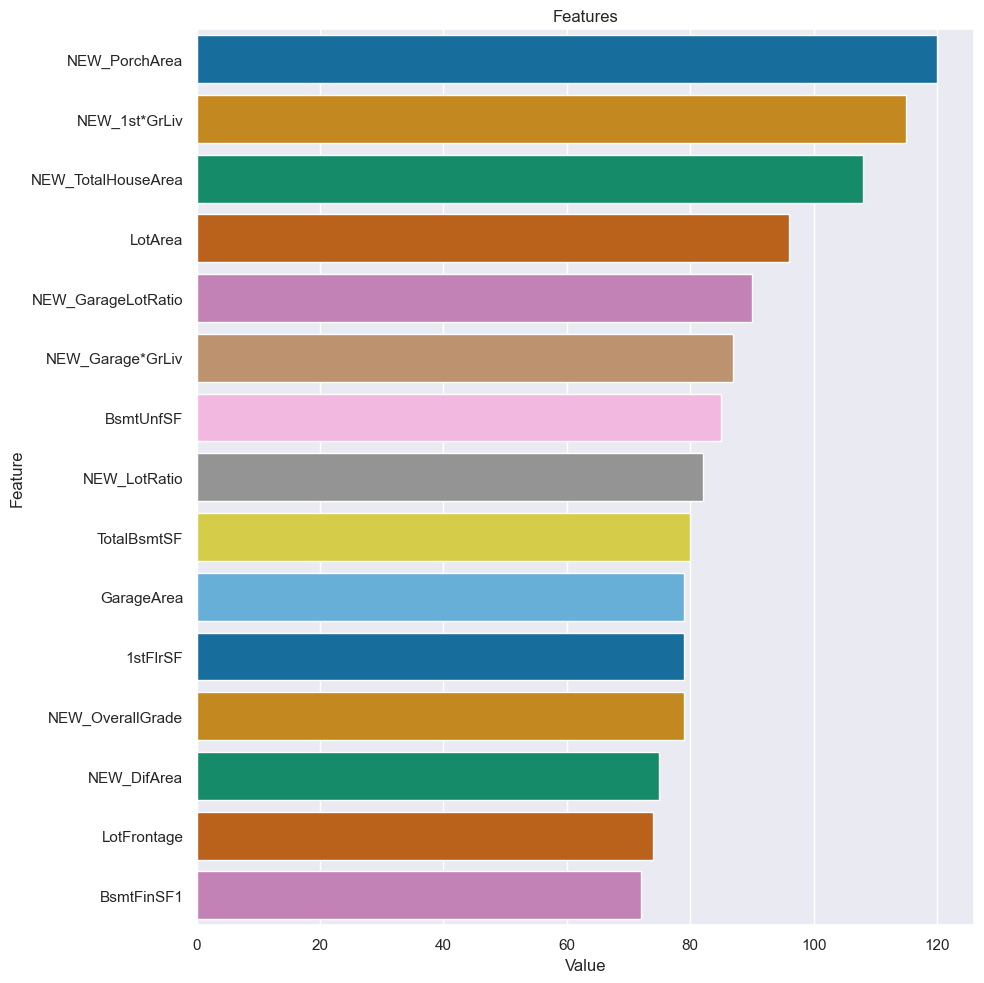

In [60]:

def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({"Value": model.feature_importances_, "Feature": features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature",palette='colorblind', data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title("Features")
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig("importances.png")

model = LGBMRegressor(verbose=-1)
model.fit(X, y)

plot_importance(model, X, num=15)

**# Prediction and Submission File Creation**

In [62]:
model = LGBMRegressor(verbose=-1)

model.fit(X, y)

predictions = model.predict(test_df.drop(["Id", "SalePrice"], axis=1))

real_predictions = np.exp(predictions)

dictionary = {"Id": test_df["Id"], "SalePrice": real_predictions}

dfSubmission = pd.DataFrame(dictionary)

dfSubmission.to_csv("housePricePredictions_2.csv", index=False)

**BONUS: Comparing with Train set**

In [64]:
model = LGBMRegressor(verbose=-1)
model.fit(X, y)
train_predictions = model.predict(X)
train_real_predictions = np.exp(train_predictions)
comparison_df = pd.DataFrame({
    'Id': train_df['Id'],
    'Actual': np.exp(y),
    'Predicted': train_real_predictions
})
comparison_df.to_csv('comparison.csv', index=False)